In [2]:
import pandas as pd
import pyproj
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.ticker as mtick
import cv2
import imutils
import numpy as np
import colorsys
import os
import shutil
from os import listdir
import random
from PIL import Image
from PIL import ImageEnhance
import torchvision
from shapely.geometry import Polygon
import shapely
import math
from PIL import ImageStat
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors
from matplotlib.offsetbox import (OffsetImage, AnnotationBbox)
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1 import inset_locator
import io
from statistics import mean 
from scipy.stats import pearsonr

## Files and map def

### Peruspiirit

In [3]:
peruspiirit = gpd.read_file("../data/peruspiirit_df.gpkg")
peruspiirit.explore()

In [4]:
peruspiirit = peruspiirit[["nimi_fi", "geometry"]]
peruspiirit

,nimi_fi,geometry
0,PUISTOLA,"POLYGON ((25503440.681 6682129.409, 25503550.5..."
1,MALMI,"POLYGON ((25502491.975 6683084.644, 25502463.7..."
2,KAMPINMALMI,"POLYGON ((25495836.153 6671983.063, 25495960.7..."
3,VIRONNIEMI,"POLYGON ((25497494.326 6673819.471, 25497427.9..."
4,ULLANLINNA,"POLYGON ((25498158.300 6672188.639, 25497957.8..."
5,TAKA-TÖÖLÖ,"POLYGON ((25495858.042 6673836.130, 25495952.7..."
6,LAUTTASAARI,"POLYGON ((25492082.703 6673384.181, 25491839.6..."
7,REIJOLA,"POLYGON ((25494677.805 6677234.824, 25494674.9..."
8,MUNKKINIEMI,"POLYGON ((25493375.484 6677494.463, 25493365.2..."
9,HAAGA,"POLYGON ((25494836.691 6679464.851, 25494598.2..."


#### Kartan luonti ja redaus

In [ ]:
meri = gpd.read_file("../data/meri.geojson")
meri = meri.explode().reset_index(drop=True)
meri = meri.to_crs(crs="EPSG:3879")
meri.drop(24, inplace=True)
meri["geometry"] = meri["geometry"].buffer(1)
meri

In [ ]:
map = peruspiirit.overlay(meri, how="difference")
map = map.explode()
map = map.geometry.unary_union
map = map.simplify(50)

map = gpd.GeoSeries(map, crs="EPSG:3879")
map = map.explode()

map = map[map.area > 30000]
map_df = gpd.GeoDataFrame(geometry=map)

In [8]:
map = map_df.overlay(peruspiirit, keep_geom_type=False)
map = map.dissolve("nimi_fi").reset_index()

In [9]:
map = gpd.clip(map, (25490461, 6667000, 25514075, 6687279))

In [10]:
map["geometry"] = map["geometry"].buffer(0)

In [9]:
map_boundary = map.copy()

map_boundary["nimi_fi"] = map_boundary["nimi_fi"].replace({"ITÄ-PAKILA":"LÄNSI-PAKILA", "JAKOMÄKI":"PUISTOLA", "KULOSAARI":"HERTTONIEMI", "ALPPIHARJU":"VALLILA", "PUKINMÄKI":"MALMI", "VIRONNIEMI":"ULLANLINNA", "TAKA-TÖÖLÖ":"REIJOLA"})
map_boundary = map_boundary.dissolve(by="nimi_fi").reset_index()

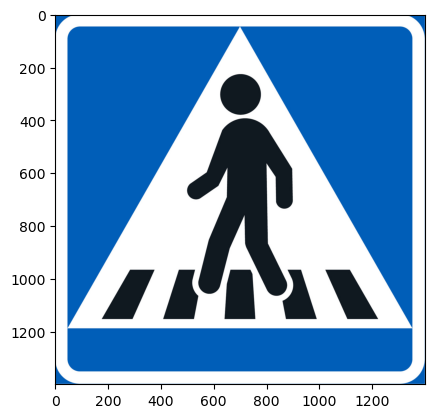

In [10]:
sign_folder = "./liikennemerkit_jpg/"
clss = 1

im = Image.open(f"{sign_folder}{clss}.jpg")
im  = im.resize((1400,1400))

plt.imshow(im)

In [ ]:
map_test_df = peruspiirit.copy()
map_test_df = map_test_df.sort_values(by="nimi_fi").reset_index(drop=True)
map_test_df["dummy_data"] = np.linspace(0.03,0.15,34)
map_test_df

In [ ]:
def luo_kartta(peruspiirit_df, color_column, cmap, title=False, im=False, vmin=0, vmax=40, save=False, scale=1, borders=0.3, colorbar=True, base_fontsize=25, subtitle=False, pil=True, cbar_percent=True, title_fontsize=30, dpi=150):
    map = map_df.overlay(peruspiirit_df, keep_geom_type=False)
    map = map.dissolve("nimi_fi").reset_index()
    map["geometry"] = map["geometry"].buffer(5)

    map['coords'] = map['geometry'].apply(lambda x: x.representative_point().coords[:])
    map['coords'] = [coords[0] for coords in map['coords']]

    map = gpd.clip(map, (25490461, 6667000, 25514075, 6687279))

    fig, ax = plt.subplots(figsize=(17*scale,11*scale))
    
    if title:
        plt.title(title, fontdict={"fontsize":title_fontsize*scale})

    if subtitle:
        plt.text(25500500, 6666500, subtitle, fontdict={"fontsize":base_fontsize*scale})

    map.plot(
        ax=ax,
        # figsize=(17,12),
        column=color_column,
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        # legend=True,
        # cax=cax,
        # legend_kwds={"loc":""}
    ).axis("off")

    map["geometry"] = map["geometry"].buffer(0)
    map.boundary.plot(
        ax=ax,
        color="black",
        linewidth=borders
    ).axis("off")


    if colorbar:
        cax = fig.add_axes([0.15, 0.32, 0.01, 0.3])
        
        cax.tick_params(size=0, labelsize=base_fontsize*scale)

        norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
        fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap),
                cax=cax, orientation='vertical', ticks=[vmin,vmax])
        
        if cbar_percent:
            cax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0))
    

    if im is not False:
        # im = im.resize((1400,1400))
        imagebox = OffsetImage(im, zoom = 0.09)
        ab = AnnotationBbox(imagebox, (25510000, 6667000), frameon = False)
        ax.add_artist(ab)


    # for i, row in map.iterrows():
    #     plt.annotate(text=row['nimi_fi'], xy=row['coords'],
    #                 horizontalalignment='center', size=7, font="sans")

    if save:
        plt.savefig(f"./Output images/map_{color_column}.png", dpi=dpi)

    if pil:
        buffer = io.BytesIO()
        plt.savefig(buffer, format='png', dpi=dpi)
        buffer.seek(0)

        # Convert the buffer to a PIL image
        pil_image = Image.open(buffer)


        if colorbar:
            s = 100
            pil_image = pil_image.crop((0+s,0,765-s-50,495))
        else:
            s = 150
            pil_image = pil_image.crop((0+s,0,765-s,495))

        # Close the Matplotlib plot to free up resources
        plt.close()

        return pil_image

###

fig, ax = plt.subplots(figsize=(5,5))

im = luo_kartta(map_test_df, "dummy_data", "Greens", "nimi_fi", scale=0.3, vmin=0.03,vmax=0.15, colorbar=True, subtitle="Oma", pil=True)
plt.imshow(im)
plt.axis("off")

### Points

In [13]:
points = gpd.read_file("./the_points.gpkg")
points

,Tag,suunta1,suunta2,Nopeusrajoitus,Peruspiiri,ID,geometry
0,72-18,187,7,30,LAAJASALO,0,POINT Z (25.08248 60.15635 1.75245)
1,71-19,351,171,30,LAAJASALO,1,POINT Z (25.08089 60.15810 4.88200)
2,71-19,200,20,30,LAAJASALO,2,POINT Z (25.08089 60.15810 4.88200)
3,67-20,316,136,30,LAAJASALO,3,POINT Z (25.06624 60.16022 13.87478)
4,68-20,201,21,30,LAAJASALO,4,POINT Z (25.06868 60.15997 13.48807)
...,...,...,...,...,...,...,...
3645,36-84,338,158,30,TUOMARINKYLÄ,3977,POINT Z (24.95413 60.27486 13.08941)
3646,33-85,261,81,30,TUOMARINKYLÄ,3978,POINT Z (24.94366 60.27409 18.42200)
3647,33-85,267,87,30,TUOMARINKYLÄ,3979,POINT Z (24.94366 60.27409 18.42200)
3648,34-85,243,63,30,TUOMARINKYLÄ,3980,POINT Z (24.94803 60.27503 16.46500)


In [ ]:
# MITKÄ PISTEET, MILLÄKIN ALUEILLA?
pointlist_df = points.groupby("Peruspiiri")["ID"].apply(list).reset_index()
pointlist_df

In [16]:
pointcount_gdf = peruspiirit.merge(pointlist_df, left_on="nimi_fi", right_on="Peruspiiri")
pointcount_gdf

,nimi_fi,geometry,Peruspiiri,ID,pointcount
0,PUISTOLA,"POLYGON ((25503440.681 6682129.409, 25503550.5...",PUISTOLA,"[2596, 2597, 2598, 2599, 2600, 2601, 2602, 260...",180
1,MALMI,"POLYGON ((25502491.975 6683084.644, 25502463.7...",MALMI,"[402, 403, 404, 405, 406, 407, 408, 409, 410, ...",239
2,KAMPINMALMI,"POLYGON ((25495836.153 6671983.063, 25495960.7...",KAMPINMALMI,"[1114, 1115, 1116, 1117, 1120, 1122, 1124, 112...",111
3,VIRONNIEMI,"POLYGON ((25497494.326 6673819.471, 25497427.9...",VIRONNIEMI,"[1882, 1883, 1884, 1885, 1886, 1887, 1888, 188...",58
4,ULLANLINNA,"POLYGON ((25498158.300 6672188.639, 25497957.8...",ULLANLINNA,"[1659, 1660, 1661, 1663, 1664, 1666, 1667, 166...",73
5,TAKA-TÖÖLÖ,"POLYGON ((25495858.042 6673836.130, 25495952.7...",TAKA-TÖÖLÖ,"[1229, 1230, 1231, 1232, 1233, 1234, 1235, 123...",56
6,LAUTTASAARI,"POLYGON ((25492082.703 6673384.181, 25491839.6...",LAUTTASAARI,"[1994, 1995, 1996, 1997, 1998, 1999, 2000, 200...",104
7,REIJOLA,"POLYGON ((25494677.805 6677234.824, 25494674.9...",REIJOLA,"[3073, 3074, 3076, 3077, 3078, 3079, 3080, 308...",92
8,MUNKKINIEMI,"POLYGON ((25493375.484 6677494.463, 25493365.2...",MUNKKINIEMI,"[2965, 2966, 2968, 2969, 2970, 2971, 2972, 297...",101
9,HAAGA,"POLYGON ((25494836.691 6679464.851, 25494598.2...",HAAGA,"[3384, 3385, 3386, 3387, 3388, 3389, 3390, 339...",129


## Average color

#### Algoritmit

In [ ]:
# DOMIANT COLOR

def laske_dominant_color(id):
    img = cv2.imread(f"./images/fov20/suunta1WIDE/{id}.jpg")
    average = img.mean(axis=0).mean(axis=0)
    pixels = np.float32(img.reshape(-1, 3))

    n_colors = 3
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 200, .1)
    flags = cv2.KMEANS_RANDOM_CENTERS

    _, labels, palette = cv2.kmeans(pixels, n_colors, None, criteria, 10, flags)
    _, counts = np.unique(labels, return_counts=True)
    dominant = palette[np.argmax(counts)]
    return dominant.tolist()

In [ ]:
def laske_dominant_color_2(list):
    list = np.array(list)
    average = np.mean(list, axis=0)
    pixels = np.float32(list)

    n_colors = 3
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 200, .1)
    flags = cv2.KMEANS_RANDOM_CENTERS

    _, labels, palette = cv2.kmeans(pixels, n_colors, None, criteria, 10, flags)
    _, counts = np.unique(labels, return_counts=True)
    dominant = palette[np.argmax(counts)]
    return dominant.tolist()

In [ ]:
def laske_avg_col(ID):
    img = cv2.imread(f"./images/fov70/suunta1/{ID}.jpg")
    avg_col = img.mean(axis=0).mean(axis=0)
    return avg_col

#### Värien laskeminen

In [ ]:
# pointlist_df["avg_col"] = 0
# pointlist_df["avg_col"] = pointlist_df["avg_col"].astype(object)

# for i, row in pointlist_df.iterrows():
#     list = []
#     for i in row["ID"]:
#         try:
#             list.append(laske_avg_col(i))
#         except:
#             None
#     print(np.mean(list, axis=0).tolist())
#     row["avg_col"] = np.mean(list, axis=0).tolist()

# pointlist_df

In [ ]:
pointlist_df["dom_col"] = 0
pointlist_df["dom_col"] = pointlist_df["dom_col"].astype(object)

for i, row in pointlist_df.iterrows():
    list = []
    for i in row["ID"]:
        try:
            list.append(laske_dominant_color(i))
            # print(laske_dominant_color(i))
        except:
            None

    print(laske_dominant_color_2(list))
    # print(list)
    row["dom_col"] = laske_dominant_color_2(list)
    

pointlist_df

##### Saturointi

In [ ]:
def rgb_to_hex(r, g, b):
    return '#{:02x}{:02x}{:02x}'.format(r, g, b)

def add_saturation(df, col, factor):
    df[col] = df[col].apply(lambda x: np.array(x)/255)

    df[col] = df[col].apply(lambda x: colorsys.rgb_to_hls(x[0], x[1], x[2]))
    df[col] = df[col].apply(lambda x: [x[0], x[1], x[2]*factor])
    df[col] = df[col].apply(lambda x: np.clip(x,0,0.99))
    df[col] = df[col].apply(lambda x: colorsys.hls_to_rgb(x[0], x[1], x[2]))

    df[col] = df[col].apply(lambda x: np.array(x)*255)

    df[col] = df[col].apply(lambda x: rgb_to_hex(int(x[0]), int(x[1]), int(x[2])))

    return df

In [ ]:
peruspiirit_color = peruspiirit.merge(right=pointlist_df, right_on="Peruspiiri", left_on="nimi_fi")

# peruspiirit_color = add_saturation(peruspiirit_color, "avg_col", 10)
peruspiirit_color = add_saturation(peruspiirit_color, "dom_col", 10)

peruspiirit_color

In [ ]:
# peruspiirit_color_df = pd.DataFrame(peruspiirit_color)
# peruspiirit_color_df.to_excel("./Output images/dom_col_3-3_W.xlsx")

#### Kartat

In [ ]:
# map = map_df.overlay(peruspiirit_color)
# map = map.dissolve("nimi_fi").reset_index()

# map['coords'] = map['geometry'].apply(lambda x: x.representative_point().coords[:])
# map['coords'] = [coords[0] for coords in map['coords']]

# fig, ax = plt.subplots(figsize=(17,11))

# map.plot(
#     ax=ax,
#     color=map["avg_col"]
# ).axis("off")

# map.boundary.plot(
#     ax=ax,
#     color="white",
#     linewidth=0.7
# ).axis("off")

# for i, row in map.iterrows():
#     plt.annotate(text=row['nimi_fi'], xy=row['coords'],
#                 horizontalalignment='center', size=7, font="sans")
    

c:\Users\pyryp\anaconda3\envs\geoenv\Lib\site-packages\geopandas\geodataframe.py:2323: UserWarning: `keep_geom_type=True` in overlay resulted in 15 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  return geopandas.overlay(


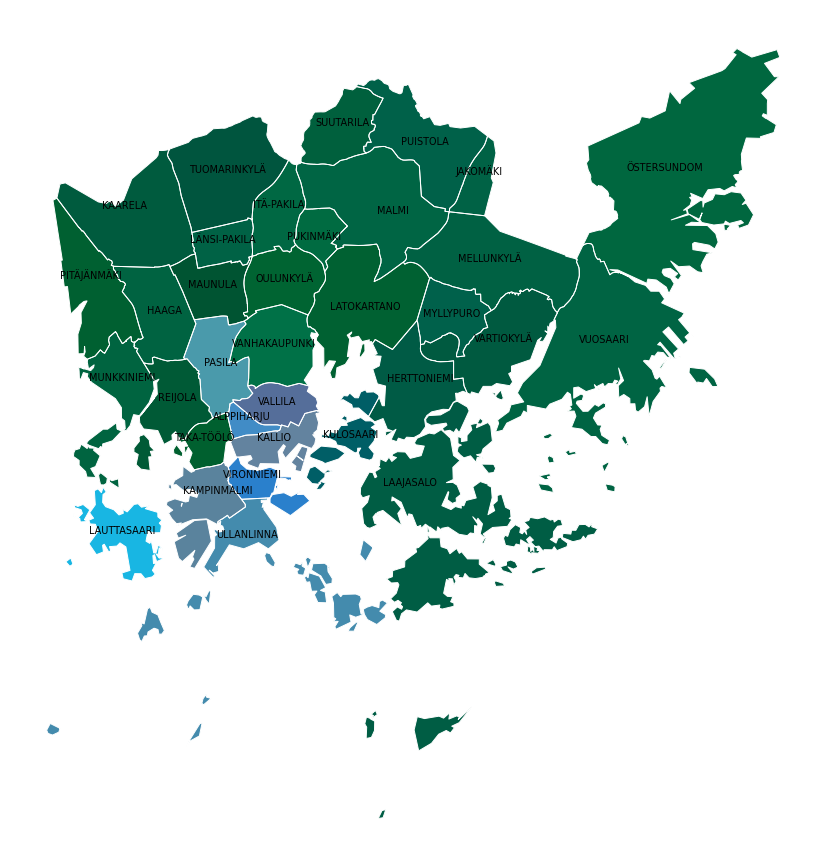

In [ ]:
map = map_df.overlay(peruspiirit_color)
map = map.dissolve("nimi_fi").reset_index()

map['coords'] = map['geometry'].apply(lambda x: x.representative_point().coords[:])
map['coords'] = [coords[0] for coords in map['coords']]

fig, ax = plt.subplots(figsize=(17,11))

map.plot(
    ax=ax,
    color=map["dom_col"]
).axis("off")

map.boundary.plot(
    ax=ax,
    color="white",
    linewidth=0.7
).axis("off")

for i, row in map.iterrows():
    plt.annotate(text=row['nimi_fi'], xy=row['coords'],
                horizontalalignment='center', size=7, font="sans")
    

## Final data

In [491]:
classmap_nc17 = {
0: "kolmio",
1: "suojatie",
2: "kävely+pyörä",
3: "parkki_kielletty",
4: "alue_parkki_kielletty",
5: "nuoli_R",
6: "työmaa",
7: "kielletty_ajosuunta",
8: "R_kielletty_käännös",
9: "L_kielletty_käännös",
10: "varo_lapsia",
11: "parkki",
12: "liikenneYMPYRÄ",
13: "moottori_AJON_kielletty",
14: "pysähtyminen_kielletty",
15: "AJON_kielletty (ympyrä)",
16: "ETUajo-oikeus",
17: "kävely-pyörä_Jaettu"
}

In [ ]:
detections_label_dir = "./Yolo_project/yolov7-custom/runs/detect/exp_run98/labels/"

file_list_detections = [file for file in os.listdir(detections_label_dir) if os.path.getsize(detections_label_dir + file) > 0] 

file_names = []
file_contents = []

for file_name in file_list_detections:
    with open(detections_label_dir + file_name, "r") as file:
        for line in file:
            content = line.split(" ")[0]

            file_names.append(file_name)
            file_contents.append(content)

data = {
    'filename': file_names,
    'class': file_contents
}

detections_df = pd.DataFrame(data)

detections_df

In [ ]:
detections_df.loc[(detections_df["filename"].str.len()<9),"filename"] = "shift_" + detections_df.loc[(detections_df["filename"].str.len()<9),"filename"]
detections_df

In [494]:
detections_df["point_ID"] = detections_df["filename"].apply(lambda x: x.split("_")[1][:-4])
detections_df["class"] = detections_df["class"].astype(int)
detections_df

,filename,class,point_ID
0,shift_1001.txt,3,1001
1,shift_1003.txt,1,1003
2,shift_1003.txt,1,1003
3,shift_1003.txt,1,1003
4,shift_1005.txt,4,1005
...,...,...,...
17322,suunta2R_978.txt,17,978
17323,suunta2R_988.txt,6,988
17324,suunta2R_988.txt,10,988
17325,suunta2R_988.txt,13,988


In [495]:
detections_df.groupby("point_ID")["class"].apply(list).reset_index()

,point_ID,class
0,10,"[6, 10, 5, 1]"
1,100,"[1, 17, 1, 7, 1, 1, 12, 12, 1, 1, 1, 0, 0]"
2,1001,"[3, 13]"
3,1003,"[1, 1, 1, 5]"
4,1004,[10]
...,...,...
3332,994,"[16, 7, 6, 1, 1, 5, 1, 1, 1]"
3333,995,[11]
3334,996,"[1, 1]"
3335,998,"[5, 5, 10, 5, 1, 5, 5]"


In [496]:
detections_df_wide = detections_df.groupby(["point_ID", "class"]).size().unstack(fill_value=0).reset_index()
detections_df_wide = detections_df_wide.rename_axis(None, axis=1)
detections_df_wide

,point_ID,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,10,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0
1,100,2,7,0,0,0,0,0,1,0,0,0,0,2,0,0,0,0,1
2,1001,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,1003,0,3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,1004,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3332,994,0,5,0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0
3333,995,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3334,996,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3335,998,0,1,0,0,0,5,0,0,0,0,1,0,0,0,0,0,0,0


In [497]:
# detections_df_wide = detections_df_wide[["point_ID", "0","1","2","3","4","5","6","7","8","9","10","11","12","13","14","15","16","17"]]
detections_df_wide = detections_df_wide[["point_ID",0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
detections_df_wide

,point_ID,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,10,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0
1,100,2,7,0,0,0,0,0,1,0,0,0,0,2,0,0,0,0,1
2,1001,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,1003,0,3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,1004,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3332,994,0,5,0,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0
3333,995,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3334,996,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3335,998,0,1,0,0,0,5,0,0,0,0,1,0,0,0,0,0,0,0


In [498]:
detections_df_wide["point_ID"] = detections_df_wide["point_ID"].astype(int)
detections_df_wide = detections_df_wide.rename(columns={"point_ID":"ID"}).merge(points[["ID", "Peruspiiri"]])

In [ ]:
detections_df_wide.rename(columns=classmap_nc17, inplace=True)
detections_df_wide

In [500]:
# detections_df_wide[detections_df_wide["ETUajo-oikeus"]>0][detections_df_wide["Peruspiiri"]=="VIRONNIEMI"]

In [ ]:
mekit_alueittain_summa = detections_df_wide.groupby(["Peruspiiri"]).sum().reset_index().drop(columns="ID")
mekit_alueittain_summa

In [ ]:
mekit_alueittain_summa["sum_signs"] = mekit_alueittain_summa.iloc[:,1:].sum(axis=1)
mekit_alueittain_summa

In [ ]:
mekit_alueittain_summa = mekit_alueittain_summa.merge(pointlist_df[["Peruspiiri","pointcount"]])
mekit_alueittain_summa

In [504]:
def yhdistä_alueet(df, alue1, alue2):
    df["Peruspiiri"] = df["Peruspiiri"].replace({alue2:alue1})
    df = df.groupby("Peruspiiri").sum().reset_index()
    df = pd.concat([df, df[df["Peruspiiri"]==alue1].replace({alue1:alue2})]).reset_index(drop=True)
    return df

In [505]:
# mekit_alueittain_summa = yhdistä_alueet(mekit_alueittain_summa, "LÄNSI-PAKILA", "ITÄ-PAKILA")
# mekit_alueittain_summa = yhdistä_alueet(mekit_alueittain_summa, "PUISTOLA", "JAKOMÄKI")
# mekit_alueittain_summa = yhdistä_alueet(mekit_alueittain_summa, "HERTTONIEMI", "KULOSAARI")
# mekit_alueittain_summa = yhdistä_alueet(mekit_alueittain_summa, "VALLILA", "ALPPIHARJU")
# mekit_alueittain_summa = yhdistä_alueet(mekit_alueittain_summa, "MALMI", "PUKINMÄKI")
# mekit_alueittain_summa = yhdistä_alueet(mekit_alueittain_summa, "ULLANLINNA", "VIRONNIEMI")
# mekit_alueittain_summa = yhdistä_alueet(mekit_alueittain_summa, "REIJOLA", "TAKA-TÖÖLÖ")

# mekit_alueittain_summa

In [506]:
# mekit_alueittain_summa["parkki_kielletty"] = mekit_alueittain_summa[["parkki_kielletty", "alue_parkki_kielletty", "pysähtyminen_kielletty"]].sum(axis=1)
mekit_alueittain_summa["parkki_kielletty"] = mekit_alueittain_summa[["parkki_kielletty", "alue_parkki_kielletty"]].sum(axis=1)

In [ ]:
mekit_alueittain_norm_signs = mekit_alueittain_summa.copy()

for col in mekit_alueittain_norm_signs.columns[1:-2]:
    mekit_alueittain_norm_signs[col] = mekit_alueittain_norm_signs[col] / mekit_alueittain_norm_signs["sum_signs"]

mekit_alueittain_norm_signs

In [508]:
mekit_alueittain_norm_points = mekit_alueittain_summa.copy()

for col in mekit_alueittain_norm_points.columns[1:-2]:
    mekit_alueittain_norm_points[col] = mekit_alueittain_norm_points[col] / mekit_alueittain_norm_points["sum_signs"]

mekit_alueittain_norm_points

,Peruspiiri,kolmio,suojatie,kävely+pyörä,parkki_kielletty,alue_parkki_kielletty,nuoli_R,työmaa,kielletty_ajosuunta,R_kielletty_käännös,...,varo_lapsia,parkki,liikenneYMPYRÄ,moottori_AJON_kielletty,pysähtyminen_kielletty,AJON_kielletty (ympyrä),ETUajo-oikeus,kävely-pyörä_Jaettu,sum_signs,pointcount
0,ALPPIHARJU,0.035897,0.441026,0.025641,0.128205,0.015385,0.092308,0.025641,0.015385,0.015385,...,0.020513,0.041026,0.015385,0.020513,0.015385,0.015385,0.010256,0.061538,195,25
1,HAAGA,0.064655,0.301724,0.047414,0.143678,0.020115,0.117816,0.034483,0.021552,0.020115,...,0.024425,0.054598,0.022989,0.043103,0.005747,0.014368,0.012931,0.050287,696,129
2,HERTTONIEMI,0.046366,0.387218,0.042607,0.117794,0.022556,0.078947,0.042607,0.027569,0.017544,...,0.028822,0.070175,0.017544,0.032581,0.011278,0.008772,0.007519,0.055138,798,159
3,ITÄ-PAKILA,0.063636,0.354545,0.081818,0.054545,0.009091,0.109091,0.054545,0.018182,0.045455,...,0.045455,0.045455,0.018182,0.018182,0.000000,0.009091,0.000000,0.072727,110,54
4,JAKOMÄKI,0.078571,0.335714,0.021429,0.157143,0.042857,0.078571,0.042857,0.007143,0.021429,...,0.042857,0.085714,0.000000,0.050000,0.007143,0.007143,0.000000,0.050000,140,42
5,KAARELA,0.050000,0.382258,0.082258,0.072581,0.014516,0.133871,0.020968,0.017742,0.024194,...,0.016129,0.061290,0.017742,0.041935,0.004839,0.008065,0.001613,0.054839,620,174
6,KALLIO,0.049713,0.372849,0.045889,0.143403,0.022945,0.070746,0.042065,0.026769,0.017208,...,0.030593,0.045889,0.009560,0.038241,0.024857,0.013384,0.007648,0.059273,523,71
7,KAMPINMALMI,0.034884,0.357881,0.040052,0.121447,0.016796,0.072351,0.034884,0.040052,0.021964,...,0.018088,0.102067,0.016796,0.025840,0.023256,0.018088,0.002584,0.045220,774,111
8,KULOSAARI,0.037037,0.370370,0.027778,0.083333,0.009259,0.120370,0.018519,0.037037,0.027778,...,0.009259,0.074074,0.009259,0.064815,0.018519,0.009259,0.027778,0.018519,108,34
9,LAAJASALO,0.063745,0.370518,0.035857,0.101594,0.031873,0.111554,0.055777,0.015936,0.013944,...,0.051793,0.065737,0.025896,0.023904,0.003984,0.007968,0.001992,0.035857,502,158


In [509]:
detection_metrics = pd.read_excel("./Yolo_project/yolov7-custom/runs/test/exp36_run98/results.xlsx")
# detection_metrics

In [510]:
detection_metrics.rename(columns={"mAP@,5":"mAP"},inplace=True)
detection_metrics

,Class,Images,Labels,P,R,mAP,"mAP@,5:,95:"
0,parkki_kielletty,400,82,0.832,0.847,0.895,0.610
1,L_kielletty_käännös,400,2,0.426,1.000,0.830,0.564
2,parkki,400,58,0.918,0.724,0.809,0.561
3,moottori_AJON_kielletty,400,19,0.812,0.632,0.744,0.561
4,nuoli_R,400,94,0.959,0.872,0.913,0.548
5,suojatie,400,277,0.938,0.814,0.858,0.539
6,kolmio,400,56,1.000,0.747,0.861,0.535
7,kielletty_ajosuunta,400,13,0.842,0.846,0.848,0.526
8,liikenneYMPYRÄ,400,8,0.728,0.750,0.812,0.514
9,all,400,744,0.813,0.733,0.758,0.473


In [512]:
classmap_nc17_inv = {v: k for k, v in classmap_nc17.items()}
classmap_nc17_inv

{'kolmio': 0,
 'suojatie': 1,
 'kävely+pyörä': 2,
 'parkki_kielletty': 3,
 'alue_parkki_kielletty': 4,
 'nuoli_R': 5,
 'työmaa': 6,
 'kielletty_ajosuunta': 7,
 'R_kielletty_käännös': 8,
 'L_kielletty_käännös': 9,
 'varo_lapsia': 10,
 'parkki': 11,
 'liikenneYMPYRÄ': 12,
 'moottori_AJON_kielletty': 13,
 'pysähtyminen_kielletty': 14,
 'AJON_kielletty (ympyrä)': 15,
 'ETUajo-oikeus': 16,
 'kävely-pyörä_Jaettu': 17}

### Map

In [513]:
mekit_alueittain_norm_signs_dgf = peruspiirit.merge(mekit_alueittain_norm_signs, left_on="nimi_fi", right_on="Peruspiiri")
mekit_alueittain_norm_points_dgf = peruspiirit.merge(mekit_alueittain_norm_points, left_on="nimi_fi", right_on="Peruspiiri")

In [15]:
def hex_to_rgb(hex_color):
    # Remove the '#' symbol if present
    hex_color = hex_color.lstrip('#')
    
    # Convert the hex color to RGB
    red = int(hex_color[0:2], 16)
    green = int(hex_color[2:4], 16)
    blue = int(hex_color[4:6], 16)
    
    return red, green, blue

In [16]:
def oma_cmap(R1, G1, B1, R2, G2, B2):
    N = 256
    vals = np.ones((N, 4))
    vals[:, 0] = np.linspace(R1/256, R2/256, N)
    vals[:, 1] = np.linspace(G1/256, G2/256, N)
    vals[:, 2] = np.linspace(B1/256, B2/256, N)
    newcmp = matplotlib.colors.ListedColormap(vals)
    return newcmp

In [17]:
def oma_cmap(c1, c2, c3, c4, c5):
    N = 256
    N2 = 64

    R1, G1, B1 = hex_to_rgb(c1)
    R2, G2, B2 = hex_to_rgb(c2)
    R3, G3, B3 = hex_to_rgb(c3)
    R4, G4, B4 = hex_to_rgb(c4)
    R5, G5, B5 = hex_to_rgb(c5)

    vals = np.ones((N, 4))

    vals[:64, 0] = np.linspace(R1/256, R2/256, N2)
    vals[:64, 1] = np.linspace(G1/256, G2/256, N2)
    vals[:64, 2] = np.linspace(B1/256, B2/256, N2)

    vals[64:128, 0] = np.linspace(R2/256, R3/256, N2)
    vals[64:128, 1] = np.linspace(G2/256, G3/256, N2)
    vals[64:128, 2] = np.linspace(B2/256, B3/256, N2)

    vals[128:192, 0] = np.linspace(R3/256, R4/256, N2)
    vals[128:192, 1] = np.linspace(G3/256, G4/256, N2)
    vals[128:192, 2] = np.linspace(B3/256, B4/256, N2)

    vals[192:, 0] = np.linspace(R4/256, R5/256, N2)
    vals[192:, 1] = np.linspace(G4/256, G5/256, N2)
    vals[192:, 2] = np.linspace(B4/256, B5/256, N2)

    newcmp = matplotlib.colors.ListedColormap(vals)
    return newcmp

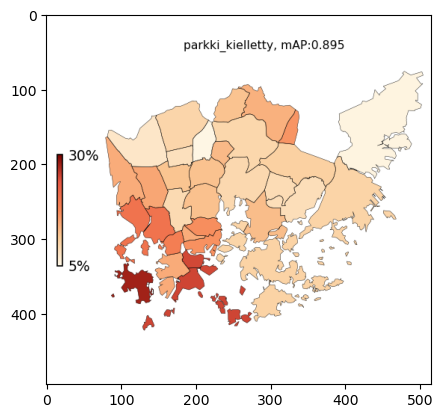

In [790]:
sign_folder = "./liikennemerkit_jpg/"

# cmap = oma_cmap(254,245,228,124,2,0)
cmap = oma_cmap("#fff7e5", "#fbcc98", "#f88656", "#e75843", "#7a0300")
# cmap = "Greens"

# sign_order = detection_metrics[~detection_metrics["Class"].isin(["all", "alue_parkki_kielletty", "pysähtyminen_kielletty"])].sort_values(by="mAP", ascending=False)["Class"].tolist()
sign_order = detection_metrics.sort_values(by="mAP", ascending=False)["Class"].tolist()


for col in ["parkki_kielletty"]:
    # try:
        vmin = mekit_alueittain_norm_signs_dgf[col].min()*1
        vmax = mekit_alueittain_norm_signs_dgf[col].max()*1.08

        mAP = detection_metrics.loc[detection_metrics["Class"]==col]["mAP"].item()
        
        clss = classmap_nc17_inv[col]
        image = Image.open(f"{sign_folder}{clss}.jpg")

        im = luo_kartta(mekit_alueittain_norm_signs_dgf, col, cmap, f'{col}, mAP:{mAP}', vmin=vmin, vmax=vmax, save=False, scale=0.3, borders=0.2, base_fontsize=30)
        plt.imshow(im)
    # except:
    #     None

## Mapillary

In [475]:
gdf_list = []

for file in os.listdir("./mapillary_data/"):
    gdf = gpd.read_file("./mapillary_data/"+file)
    gdf_list.append(gdf)

In [476]:
mapillary_signs = pd.concat(gdf_list)
mapillary_signs = mapillary_signs[["value", "geometry"]].drop_duplicates().reset_index(drop=True)
mapillary_signs.to_crs(crs="EPSG:3879", inplace=True)
mapillary_signs

,value,geometry
0,regulatory--maximum-speed-limit-30--g1,POINT (25488885.604 6675949.519)
1,regulatory--shared-path-pedestrians-and-bicycl...,POINT (25489298.026 6675949.776)
2,regulatory--yield--g1,POINT (25488897.815 6675953.047)
3,information--dead-end-except-bicycles--g1,POINT (25488885.318 6675953.085)
4,regulatory--maximum-speed-limit-40--g1,POINT (25488897.518 6675953.048)
...,...,...
127143,regulatory--no-parking--g1,POINT (25493369.930 6671055.209)
127144,regulatory--no-parking--g1,POINT (25493348.181 6671056.438)
127145,regulatory--shared-path-pedestrians-and-bicycl...,POINT (25493326.433 6671057.667)
127146,regulatory--no-parking--g1,POINT (25493598.473 6671060.455)


In [ ]:
mapillary_signs = mapillary_signs.overlay(peruspiirit, how="intersection").reset_index(drop=True)
mapillary_signs

In [478]:
mapillary_signs = mapillary_signs[["value","nimi_fi", "geometry"]]
mapillary_signs

,value,nimi_fi,geometry
0,warning--pedestrians-crossing--g6,MUNKKINIEMI,POINT (25492911.892 6675943.376)
1,warning--children--g1,MUNKKINIEMI,POINT (25492911.595 6675943.674)
2,information--pedestrians-crossing--g1,MUNKKINIEMI,POINT (25492736.973 6675966.890)
3,information--pedestrians-crossing--g1,MUNKKINIEMI,POINT (25492744.119 6675969.252)
4,information--pedestrians-crossing--g1,MUNKKINIEMI,POINT (25492732.245 6675983.238)
...,...,...,...
91456,information--pedestrians-crossing--g1,LÄNSI-PAKILA,POINT (25496919.932 6680776.199)
91457,regulatory--dual-path-pedestrians-and-bicycles...,LÄNSI-PAKILA,POINT (25496919.338 6680776.792)
91458,regulatory--shared-path-pedestrians-and-bicycl...,LÄNSI-PAKILA,POINT (25496808.794 6680778.667)
91459,information--pedestrians-crossing--g1,LÄNSI-PAKILA,POINT (25496906.859 6680778.880)


In [479]:
mapillary_signs_hel_list = mapillary_signs["value"].unique().tolist()

In [ ]:
mapillary_signs.loc[:,"value"] = mapillary_signs["value"].apply(lambda x: x[:-4])
mapillary_signs

In [481]:
classmap_mapillary = {
"regulatory--yield":"kolmio",
"information--pedestrians-crossing":"suojatie",
"regulatory--shared-path-pedestrians-and-bicycles":"kävely+pyörä",
"regulatory--no-parking":"parkki_kielletty",
"regulatory--keep-right":"nuoli_R",
"regulatory--keep-left":"nuoli_L",
"regulatory--pass-on-either-side":"nuoli_jakaja",
"regulatory--no-entry":"kielletty_ajosuunta",
"regulatory--no-right-turn":"R_kielletty_käännös",
"regulatory--no-left-turn":"L_kielletty_käännös",
"regulatory--one-way-right":"yksisuuntainen",
"regulatory--one-way-straight":"yksisuuntainen",
"regulatory--one-way-left":"yksisuuntainen",
"warning--children":"varo_lapsia",
"information--parking":"parkki",
"information--parking":"parkki",
"information--parking":"parkki",
"regulatory--roundabout":"liikenneYMPYRÄ",
"regulatory--end-of-no-parking":"end_parkki_kielto",
"regulatory--no-motor-vehicles":"moottori_AJON_kielletty",
"regulatory--no-stopping":"pysähtyminen_kielletty",
"information--dead-end":"umpikuja",
"information--dead-end-left":"umpikuja",
"information--dead-end-right":"umpikuja",
"information--dead-end-except-bicycles":"umpikuja",
"regulatory--bicycles-only":"pyörätie",
"regulatory--pedestrians-only":"kävelytie",
"regulatory--road-closed-to-vehicles":"AJON_kielletty (ympyrä)",
"regulatory--priority-road":"ETUajo-oikeus",
"regulatory--dual-path-bicycles-and-pedestrians":"kävely-pyörä_Jaettu",
"regulatory--dual-path-pedestrians-and-bicycles":"kävely-pyörä_Jaettu",
"regulatory--buses-and-taxi-only":"BUSSIkaista",
"regulatory--stop":"STOP",
"warning--roadworks":"työmaa"
}

In [482]:
classlist_nc27_mapillary = list(classmap_mapillary.keys())

In [ ]:
mapillary_signs_keep_list = []

for item in mapillary_signs_hel_list:
    if any(item[:-4] in s for s in classlist_nc27_mapillary):
        mapillary_signs_keep_list.append(item)

mapillary_signs_keep_list

In [484]:
mapillary_signs["value_fin"] = mapillary_signs["value"].apply(lambda x: classmap_mapillary.get(x,np.nan))    
mapillary_signs

,value,nimi_fi,geometry,value_fin
0,warning--pedestrians-crossing,MUNKKINIEMI,POINT (25492911.892 6675943.376),NaN
1,warning--children,MUNKKINIEMI,POINT (25492911.595 6675943.674),varo_lapsia
2,information--pedestrians-crossing,MUNKKINIEMI,POINT (25492736.973 6675966.890),suojatie
3,information--pedestrians-crossing,MUNKKINIEMI,POINT (25492744.119 6675969.252),suojatie
4,information--pedestrians-crossing,MUNKKINIEMI,POINT (25492732.245 6675983.238),suojatie
...,...,...,...,...
91456,information--pedestrians-crossing,LÄNSI-PAKILA,POINT (25496919.932 6680776.199),suojatie
91457,regulatory--dual-path-pedestrians-and-bicycles,LÄNSI-PAKILA,POINT (25496919.338 6680776.792),kävely-pyörä_Jaettu
91458,regulatory--shared-path-pedestrians-and-bicycles,LÄNSI-PAKILA,POINT (25496808.794 6680778.667),kävely+pyörä
91459,information--pedestrians-crossing,LÄNSI-PAKILA,POINT (25496906.859 6680778.880),suojatie


In [485]:
mapillary_totals = mapillary_signs.groupby("nimi_fi")["value"].count().reset_index().rename(columns={"value":"sum_signs"})

In [ ]:
mapillary_signs.dropna(inplace=True)
mapillary_signs

In [ ]:
mapillary_signs_wide = mapillary_signs.groupby(["nimi_fi", "value_fin"]).size().unstack(fill_value=0).reset_index()
mapillary_signs_wide = mapillary_signs_wide.rename_axis(None, axis=1)
mapillary_signs_wide

In [ ]:
mapillary_signs_wide = mapillary_signs_wide.merge(mapillary_totals)

mapillary_signs_wide["parkki_kielletty"] = mapillary_signs_wide[["parkki_kielletty", "pysähtyminen_kielletty"]].sum(axis=1)
mapillary_signs_wide

In [489]:
mapillary_signs_wide_norm_signs = mapillary_signs_wide.copy()

for col in mapillary_signs_wide_norm_signs.columns[1:-1]:
    mapillary_signs_wide_norm_signs[col] = mapillary_signs_wide_norm_signs[col] / mapillary_signs_wide_norm_signs["sum_signs"]

mapillary_signs_wide_norm_signs

,nimi_fi,AJON_kielletty (ympyrä),BUSSIkaista,ETUajo-oikeus,L_kielletty_käännös,R_kielletty_käännös,STOP,end_parkki_kielto,kielletty_ajosuunta,kolmio,...,parkki,parkki_kielletty,pysähtyminen_kielletty,pyörätie,suojatie,työmaa,umpikuja,varo_lapsia,yksisuuntainen,sum_signs
0,ALPPIHARJU,0.000000,0.001375,0.015120,0.012371,0.005498,0.001375,0.000687,0.010997,0.034364,...,0.042612,0.197251,0.038488,0.006873,0.242612,0.046048,0.000687,0.021306,0.010309,1455
1,HAAGA,0.000000,0.003421,0.025660,0.003421,0.002688,0.001711,0.000000,0.009286,0.051075,...,0.031036,0.154692,0.016129,0.006354,0.192815,0.051808,0.002444,0.015152,0.011975,4092
2,HERTTONIEMI,0.000901,0.002252,0.008784,0.003604,0.005856,0.003829,0.000450,0.010360,0.046622,...,0.083108,0.159234,0.018468,0.005405,0.227477,0.032658,0.001351,0.012387,0.010811,4440
3,ITÄ-PAKILA,0.000000,0.002466,0.012330,0.000000,0.013564,0.000000,0.000000,0.003699,0.050555,...,0.008631,0.041924,0.000000,0.009864,0.120838,0.059186,0.004932,0.007398,0.012330,811
4,JAKOMÄKI,0.000000,0.000000,0.000000,0.002155,0.004310,0.000000,0.000000,0.004310,0.060345,...,0.047414,0.081897,0.023707,0.000000,0.183190,0.025862,0.000000,0.002155,0.008621,464
5,KAARELA,0.000000,0.000309,0.005257,0.001237,0.000928,0.001237,0.001237,0.004638,0.052566,...,0.083488,0.114100,0.004947,0.007112,0.233766,0.047619,0.003401,0.013296,0.007730,3234
6,KALLIO,0.000369,0.005163,0.006085,0.013830,0.006085,0.004057,0.000553,0.009589,0.035589,...,0.071178,0.180712,0.042228,0.010880,0.204499,0.064540,0.004241,0.005901,0.018071,5423
7,KAMPINMALMI,0.000600,0.005399,0.001200,0.014637,0.013677,0.001440,0.000240,0.021116,0.034073,...,0.102939,0.200360,0.072226,0.010798,0.191722,0.057229,0.003839,0.009718,0.017397,8335
8,KULOSAARI,0.000000,0.000000,0.000000,0.002141,0.001071,0.005353,0.000000,0.003212,0.039615,...,0.051392,0.188437,0.013919,0.013919,0.209850,0.062099,0.006424,0.011777,0.011777,934
9,LAAJASALO,0.000410,0.000820,0.003280,0.001230,0.002870,0.007790,0.001230,0.009430,0.043050,...,0.091841,0.103731,0.006150,0.007790,0.276753,0.041820,0.002870,0.011480,0.016810,2439


### Map

In [490]:
mapillary_signs_wide_norm_signs_dgf = peruspiirit.merge(mapillary_signs_wide_norm_signs, left_on="nimi_fi", right_on="nimi_fi")

In [452]:
cmap = oma_cmap("#fff7e5", "#fbcc98", "#f88656", "#e75843", "#7a0300")
# cmap = "Greens"

for col in mapillary_signs_wide_norm_signs_dgf.columns[2:-1].tolist():
    # diff = mapillary_signs_wide_norm_signs_dgf[col].max() - mapillary_signs_wide_norm_signs_dgf[col].min()
    # vmin = mapillary_signs_wide_norm_signs_dgf[col].min() - 0.15*diff
    # vmax = mapillary_signs_wide_norm_signs_dgf[col].max() + 0.15*diff

    vmin = mapillary_signs_wide_norm_signs_dgf[col].min()*1
    vmax = mapillary_signs_wide_norm_signs_dgf[col].max()*1.08

    luo_kartta(mapillary_signs_wide_norm_signs_dgf, col, cmap, f"{col}", vmin=vmin, vmax=vmax, save=False, scale=0.3, borders=0.2)

### Yleisimmät merkit

In [518]:
fin_classmap = {'kolmio':"Väistämisvelvollisuus risteyksessä",
 'suojatie':"Suojatie",
 'kävely+pyörä':"Yhdistetty pyörätie ja jalkakäytävä",
 'parkki_kielletty':"Pysäköinti kielletty",
 'nuoli_R':"Liikenteenjakaja (oikealle)",
 'kielletty_ajosuunta':"Kielletty ajosuunta",
 'R_kielletty_käännös':"Oikealle kääntyminen kielletty",
 'L_kielletty_käännös':"Vasemmalle kääntyminen kielletty",
 'varo_lapsia':"Varo lapsia",
 'parkki':"Pysäköintipaikka",
 'liikenneYMPYRÄ':"Liikenneympyrä",
 'moottori_AJON_kielletty':"Moottorikäyttöisellä ajoneuvolla ajo kielletty",
 'pysähtyminen_kielletty':"Pysäyttäminen kielletty",
 'AJON_kielletty (ympyrä)':"Ajoneuvolla ajaminen kielletty",
 'ETUajo-oikeus':"Etuajo-oikeutettu tie",
 'kävely-pyörä_Jaettu':"Pyörätie ja jalkakäytävä rinnakkain",
 "työmaa":"Työmaa",
 "alue_parkki_kielletty":"Pysäköintikieltoalue"
 }

In [ ]:
# mapillary_signs_wide_norm_signs.iloc[:,1:-2].idxmax(axis=1)
yleisimmät_merkit = mapillary_signs_wide_norm_signs.copy()
yleisimmät_merkit["1."] = np.nan
yleisimmät_merkit["2."] = np.nan
yleisimmät_merkit["3."] = np.nan

yleisimmät_merkit = yleisimmät_merkit[["nimi_fi", "1.", "2.", "3."]]

for col in yleisimmät_merkit.columns[1:]:
    n = int(col[0])
    yleisimmät_merkit[col] = mapillary_signs_wide_norm_signs.iloc[:,1:-2].apply(lambda x: x.nlargest(n).index[-1], axis=1)

yleisimmät_merkit

In [532]:
classcounts_df = mapillary_signs_wide.iloc[:,1:-2].sum().reset_index(name="count").rename(columns={"index":"class"})
classcounts_df["class"] = classcounts_df["class"].map(fin_classmap)
classcounts_df.sort_values(by="count", ascending=False).dropna()

,class,count
21,Suojatie,20377
18,Pysäköinti kielletty,14957
15,Liikenteenjakaja (oikealle),6328
17,Pysäköintipaikka,5994
22,Työmaa,4215
9,Yhdistetty pyörätie ja jalkakäytävä,3883
10,Pyörätie ja jalkakäytävä rinnakkain,3839
8,Väistämisvelvollisuus risteyksessä,3605
19,Pysäyttäminen kielletty,2941
13,Moottorikäyttöisellä ajoneuvolla ajo kielletty,1443


In [533]:
classcounts_df = mekit_alueittain_summa.iloc[:,1:-2].sum().reset_index(name="count").rename(columns={"index":"class"})
classcounts_df["class"] = classcounts_df["class"].map(fin_classmap)
classcounts_df.sort_values(by="count", ascending=False).dropna()

,class,count
1,Suojatie,5981
3,Pysäköinti kielletty,2085
5,Liikenteenjakaja (oikealle),1732
11,Pysäköintipaikka,1050
2,Yhdistetty pyörätie ja jalkakäytävä,988
17,Pyörätie ja jalkakäytävä rinnakkain,938
0,Väistämisvelvollisuus risteyksessä,740
6,Työmaa,632
13,Moottorikäyttöisellä ajoneuvolla ajo kielletty,557
7,Kielletty ajosuunta,463


## Comp maps

In [517]:
signs = mekit_alueittain_norm_signs_dgf.columns.intersection(mapillary_signs_wide_norm_signs_dgf.columns[2:-1]).tolist()
signs

['kolmio',
 'suojatie',
 'kävely+pyörä',
 'parkki_kielletty',
 'nuoli_R',
 'työmaa',
 'kielletty_ajosuunta',
 'R_kielletty_käännös',
 'L_kielletty_käännös',
 'varo_lapsia',
 'parkki',
 'liikenneYMPYRÄ',
 'moottori_AJON_kielletty',
 'pysähtyminen_kielletty',
 'AJON_kielletty (ympyrä)',
 'ETUajo-oikeus',
 'kävely-pyörä_Jaettu']

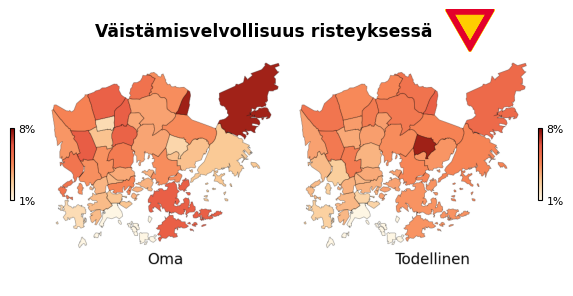

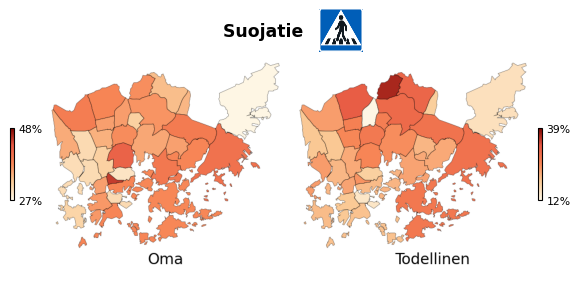

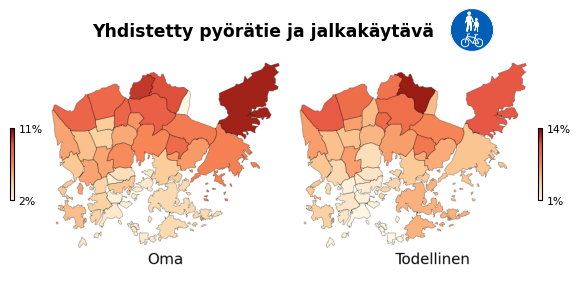

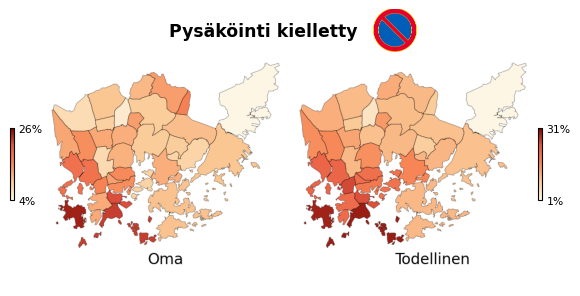

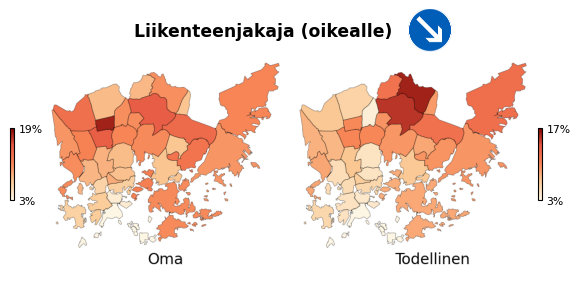

...

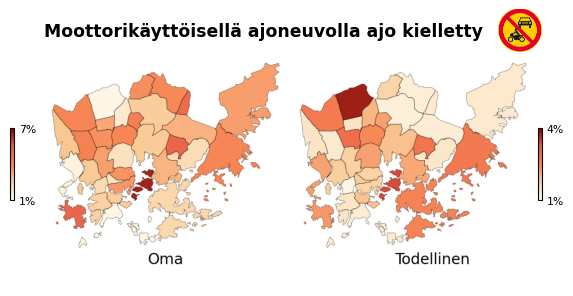

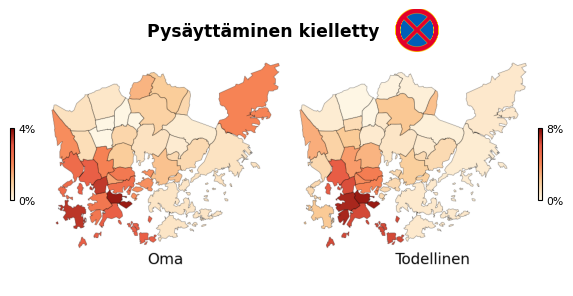

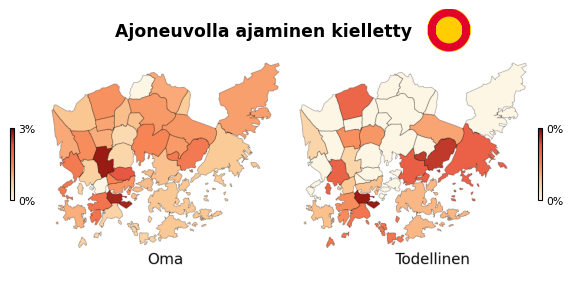

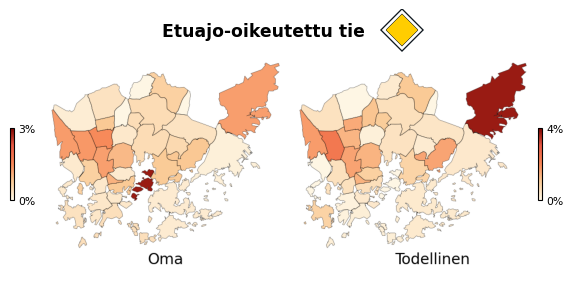

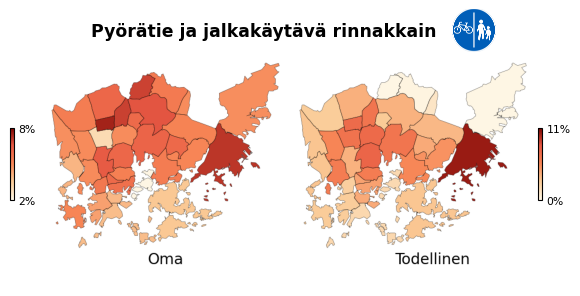

In [521]:
sign_folder = "./liikennemerkit_jpg/"

# cmap = oma_cmap(254,245,228,124,2,0)
cmap = oma_cmap("#fff7e5", "#fbcc98", "#f88656", "#e75843", "#7a0300")

for col in signs:
        # variables
        base_fontsize = 45
        base_fontsize_pr = 26
        scale = 0.3

        class_fin_name = fin_classmap[col]
        class_num = classmap_nc17_inv[col]
        title = class_fin_name + "    "

        vmin1 = mekit_alueittain_norm_signs_dgf[col].min()
        vmax1 = mekit_alueittain_norm_signs_dgf[col].max()*1.08

        vmin2 = mapillary_signs_wide_norm_signs_dgf[col].min()
        vmax2 = mapillary_signs_wide_norm_signs_dgf[col].max()*1.08

        vmin = mean([vmin1,vmin2])
        vmax = mean([vmax1, vmax2])


        ### fig

        fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2)

        # maps
        im1 = luo_kartta(mekit_alueittain_norm_signs_dgf, col, cmap, "", vmin=vmin1, vmax=vmax1, save=False, scale=scale, borders=0.2, colorbar=False, base_fontsize=base_fontsize, subtitle="Oma")
        im2 = luo_kartta(mapillary_signs_wide_norm_signs_dgf, col, cmap, "", vmin=vmin2, vmax=vmax2, save=False, scale=scale, borders=0.2, colorbar=False, base_fontsize=base_fontsize, subtitle="Todellinen")
        im3 = Image.open(f"{sign_folder}{class_num}.jpg")

        ax1.imshow(im1)
        ax2.imshow(im2)

        ax1.axis("off")
        ax2.axis("off")

        plt.subplots_adjust(wspace=0)

        #title
        suptitle = fig.suptitle(title, y=0.77, fontsize=base_fontsize*scale*0.92, fontweight='bold')


        # colorbarL
        cax = fig.add_axes([0.085, 0.4, 0.006, 0.15]) # left

        cax.tick_params(size=0, labelsize=base_fontsize_pr*scale)

        norm = mpl.colors.Normalize(vmin=vmin1, vmax=vmax1)
        fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap),
                cax=cax, orientation='vertical', ticks=[vmin1,vmax1])

        cax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0))

        # colorbarR
        cax2 = fig.add_axes([0.91, 0.4, 0.006, 0.15]) # right

        cax2.tick_params(size=0, labelsize=base_fontsize_pr*scale)

        norm = mpl.colors.Normalize(vmin=vmin2, vmax=vmax2)
        fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap),
                cax=cax2, orientation='vertical', ticks=[vmin2,vmax2])

        cax2.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0))


        # liikennemerkin kuva
        x = suptitle.get_position()[0]
        w = suptitle.get_window_extent().width

        im3_x = x+((w/640)/2)-0.025

        im3_size = 0.09
        pix = fig.add_axes([im3_x, 0.707, im3_size, im3_size])
        pix.axis("off")
        pix.imshow(im3)

        # show
        # plt.savefig(f"./Output images/comps/{class_fin_name}.png")
        plt.show()
        # print(x)
        # print(w)
        # print(fig.get_figwidth())
        # print(fig.dpi)

## Comparison with ground truth

In [75]:
# KORRELAATIO ALUEET

df1 = mekit_alueittain_norm_signs.copy()
df2 = mapillary_signs_wide_norm_signs.copy()

df1 = df1.transpose()
df1.columns = df1.iloc[0]
df1 = df1.iloc[1:-2]

df2 = df2.transpose()
df2.columns = df2.iloc[0]
df2 = df2.iloc[1:-1]

df1 = df1.astype(float)
df2 = df2.astype(float)
df1.corrwith(df2)

ALPPIHARJU       0.978386
HAAGA            0.956059
HERTTONIEMI      0.952363
ITÄ-PAKILA       0.828270
JAKOMÄKI         0.933889
KAARELA          0.956368
KALLIO           0.960478
KAMPINMALMI      0.942170
KULOSAARI        0.914805
LAAJASALO        0.972485
LATOKARTANO      0.974490
LAUTTASAARI      0.987348
LÄNSI-PAKILA     0.967561
MALMI            0.971846
MAUNULA          0.962672
MELLUNKYLÄ       0.986355
MUNKKINIEMI      0.968922
MYLLYPURO        0.904600
OULUNKYLÄ        0.964476
PASILA           0.968156
PITÄJÄNMÄKI      0.955568
PUISTOLA         0.935474
PUKINMÄKI        0.980338
REIJOLA          0.981669
SUUTARILA        0.987669
TUOMARINKYLÄ     0.975239
ULLANLINNA       0.933602
VALLILA          0.969011
VANHAKAUPUNKI    0.973833
VARTIOKYLÄ       0.967603
VIRONNIEMI       0.896746
VUOSAARI         0.971297
ÖSTERSUNDOM      0.896091
TAKA-TÖÖLÖ       0.979494
dtype: float64

In [76]:
# KORRELAATIO MERKIT

df1 = mekit_alueittain_norm_signs.copy()
df2 = mapillary_signs_wide_norm_signs.copy()

df1 = df1.iloc[:,1:-2]
df2 = df2.iloc[:,1:-1]

df1.corrwith(df2)

kolmio                    -0.052298
suojatie                   0.229681
kävely+pyörä               0.326954
parkki_kielletty           0.429384
nuoli_R                    0.245874
kielletty_ajosuunta        0.269147
R_kielletty_käännös        0.139648
L_kielletty_käännös        0.134459
varo_lapsia                0.041274
parkki                     0.286884
liikenneYMPYRÄ             0.138299
moottori_AJON_kielletty    0.098675
pysähtyminen_kielletty     0.284610
AJON_kielletty (ympyrä)   -0.046884
ETUajo-oikeus              0.247376
kävely-pyörä_Jaettu        0.234800
BUSSIkaista                     NaN
STOP                            NaN
alue_parkki_kielletty           NaN
end_parkki_kielto               NaN
kävelytie                       NaN
nuoli_L                         NaN
nuoli_jakaja                    NaN
pyörätie                        NaN
työmaa                          NaN
umpikuja                        NaN
yksisuuntainen                  NaN
dtype: float64

In [77]:
# MEAN ABSOLUTE ERROR - STANDARDISOITU - (2. PARAS?)

df1 = mekit_alueittain_norm_signs.copy()
df2 = mapillary_signs_wide_norm_signs.copy()

df1 = df1.iloc[:,1:-2]
df2 = df2.iloc[:,1:-1]

for col in df1:
    df1[col] = (df1[col] - df1[col].min()) / (df1[col].max() - df1[col].min())  

for col in df2:
    df2[col] = (df2[col] - df2[col].min()) / (df2[col].max() - df2[col].min())  

df1 = df1.astype(float)
df2 = df2.astype(float)

cols = df1.columns.intersection(df2.columns)

for col in cols:
    # try:
        mae = np.abs(df1[col] - df2[col]).mean().round(2)
        print(f"{col}: {mae}")
    # except:
    #     None

kolmio: 0.26
suojatie: 0.24
kävely+pyörä: 0.2
parkki_kielletty: 0.18
nuoli_R: 0.23
kielletty_ajosuunta: 0.25
R_kielletty_käännös: 0.33
L_kielletty_käännös: 0.3
varo_lapsia: 0.26
parkki: 0.25
liikenneYMPYRÄ: 0.3
moottori_AJON_kielletty: 0.28
pysähtyminen_kielletty: 0.26
AJON_kielletty (ympyrä): 0.35
ETUajo-oikeus: 0.43
kävely-pyörä_Jaettu: 0.24


In [78]:
# MEAN ABSOLUTE ERROR - STANDARDISOITU - (norm signs vs norm points)

df1 = mekit_alueittain_norm_signs.copy()
df2 = mekit_alueittain_norm_points.copy()

df1 = df1.iloc[:,1:-2]
df2 = df2.iloc[:,1:-1]

for col in df1:
    df1[col] = (df1[col] - df1[col].min()) / (df1[col].max() - df1[col].min())  

for col in df2:
    df2[col] = (df2[col] - df2[col].min()) / (df2[col].max() - df2[col].min())  

df1 = df1.astype(float)
df2 = df2.astype(float)

cols = df1.columns.intersection(df2.columns)

for col in cols:
    # try:
        mae = np.abs(df1[col] - df2[col]).mean().round(2)
        print(f"{col}: {mae}")
    # except:
    #     None

kolmio: 0.0
suojatie: 0.0
kävely+pyörä: 0.0
parkki_kielletty: 0.0
alue_parkki_kielletty: 0.0
nuoli_R: 0.0
työmaa: 0.0
kielletty_ajosuunta: 0.0
R_kielletty_käännös: 0.0
L_kielletty_käännös: 0.0
varo_lapsia: 0.0
parkki: 0.0
liikenneYMPYRÄ: 0.0
moottori_AJON_kielletty: 0.0
pysähtyminen_kielletty: 0.0
AJON_kielletty (ympyrä): 0.0
ETUajo-oikeus: 0.0
kävely-pyörä_Jaettu: 0.0


In [79]:
# MEAN ABSOLUTE ERROR - STANDARDISOITU - (norm signs vs norm points)

df1 = mekit_alueittain_norm_signs.copy()

df1 = df1.iloc[:,-2:]

for col in df1:
    df1[col] = (df1[col] - df1[col].min()) / (df1[col].max() - df1[col].min())  

df1 = df1.astype(float)

mae = np.abs(df1["sum_signs"] - df1["pointcount"]).mean().round(6)
print(mae)


0.172431


In [80]:
detection_metrics_map = detection_metrics[["Class", "mAP"]]

#### MSE

In [522]:
# MEAN SQUARED ERROR - STANDARDISOITU, min-max - PARAS?

mse_df_dict = {}

df1 = mekit_alueittain_norm_signs.copy()
df2 = mapillary_signs_wide_norm_signs.copy()

df1 = df1.iloc[:,1:-2]
df2 = df2.iloc[:,1:-1]

for col in df1:
    df1[col] = (df1[col] - df1[col].min()) / (df1[col].max() - df1[col].min())  

for col in df2:
    df2[col] = (df2[col] - df2[col].min()) / (df2[col].max() - df2[col].min())  

df1 = df1.astype(float)
df2 = df2.astype(float)

cols = df1.columns.intersection(df2.columns)

for col in cols:
    mse = np.abs((df1[col] - df2[col])**2).mean().round(2)
    # print(f"{col}: {mse}")
    # detection_metrics_map.loc[detection_metrics_map["Class"]==col,"MSE"] = mse
    mse_df_dict[col] = mse

    mse_df = pd.DataFrame.from_dict(mse_df_dict, orient="index").reset_index()
    mse_df.columns = ["Class", "MSE"]

mse_df.sort_values(by="MSE")

,Class,MSE
3,parkki_kielletty,0.02
2,kävely+pyörä,0.03
4,nuoli_R,0.04
13,pysähtyminen_kielletty,0.04
0,kolmio,0.05
1,suojatie,0.05
15,ETUajo-oikeus,0.05
6,kielletty_ajosuunta,0.06
10,parkki,0.06
11,liikenneYMPYRÄ,0.08


In [523]:
results = pd.read_excel("./Yolo_project/yolov7-custom/runs/test/exp36_run98/results.xlsx")
results = pd.merge(left=results, right=mse_df)
results["Class"] = results["Class"].map(fin_classmap)
results[["Class","MSE","mAP@,5", "mAP@,5:,95:"]]

,Class,MSE,"mAP@,5","mAP@,5:,95:"
0,Pysäköinti kielletty,0.02,0.895,0.610
1,Vasemmalle kääntyminen kielletty,0.08,0.830,0.564
2,Pysäköintipaikka,0.06,0.809,0.561
3,Moottorikäyttöisellä ajoneuvolla ajo kielletty,0.10,0.744,0.561
4,Liikenteenjakaja (oikealle),0.04,0.913,0.548
5,Suojatie,0.05,0.858,0.539
6,Väistämisvelvollisuus risteyksessä,0.05,0.861,0.535
7,Kielletty ajosuunta,0.06,0.848,0.526
8,Liikenneympyrä,0.08,0.812,0.514
9,Työmaa,0.16,0.668,0.466


In [82]:
# MEAN SQUARED ERROR - STANDARDISOITU, z-score - PARAS?

df1 = mekit_alueittain_norm_signs.copy()
df2 = mapillary_signs_wide_norm_signs.copy()

df1 = df1.iloc[:,1:-2]
df2 = df2.iloc[:,1:-1]

df1 = df1.astype(float)
df2 = df2.astype(float)

# z-score normalization
for col in df1.columns:
    mean = df1[col].mean()
    std_dev = df1[col].std()
    df1[col] = df1[col].apply(lambda x:(x - mean) / std_dev)

for col in df2.columns:
    mean = df2[col].mean()
    std_dev = df2[col].std()
    df2[col] = df2[col].apply(lambda x:(x - mean) / std_dev)

# min-max
for col in df1:
    df1[col] = (df1[col] - df1[col].min()) / (df1[col].max() - df1[col].min())  

for col in df2:
    df2[col] = (df2[col] - df2[col].min()) / (df2[col].max() - df2[col].min())  


cols = df1.columns.intersection(df2.columns)

for col in cols:    
    mse = np.abs((df1[col] - df2[col])**2).mean().round(2)
    print(f"{col}: {mse}")
    detection_metrics_map.loc[detection_metrics_map["Class"]==col,"MSE"] = mse

kolmio: 0.12
suojatie: 0.1
kävely+pyörä: 0.07
parkki_kielletty: 0.05
nuoli_R: 0.1
kielletty_ajosuunta: 0.1
R_kielletty_käännös: 0.16
L_kielletty_käännös: 0.15
varo_lapsia: 0.11
parkki: 0.11
liikenneYMPYRÄ: 0.13
moottori_AJON_kielletty: 0.12
pysähtyminen_kielletty: 0.13
AJON_kielletty (ympyrä): 0.19
ETUajo-oikeus: 0.24
kävely-pyörä_Jaettu: 0.1


In [83]:
detection_metrics_map.dropna()

,Class,mAP,MSE
0,varo_lapsia,0.975,0.11
1,kävely+pyörä,0.866,0.07
2,suojatie,0.840,0.10
3,kielletty_ajosuunta,0.838,0.10
4,kolmio,0.830,0.12
5,nuoli_R,0.819,0.10
6,pysähtyminen_kielletty,0.805,0.13
8,parkki_kielletty,0.799,0.05
9,parkki,0.763,0.11
11,ETUajo-oikeus,0.668,0.24


In [117]:
# PERCENTAGE ERROR
error_percent = {}

df1 = mekit_alueittain_norm_signs.copy()
df2 = mapillary_signs_wide_norm_signs.copy()

df1 = df1.iloc[:,1:-2]
df2 = df2.iloc[:,1:-1]

df1 = df1.astype(float)
df2 = df2.astype(float)

df1.replace(0, np.nan, inplace=True)
df2.replace(0, np.nan, inplace=True)

cols = df1.columns.intersection(df2.columns)

for col in cols:
    try:
        prerror = (((df1[col] - df2[col]) / df1[col])).mean(skipna=True).round(2)
        # print(f"{col}: {prerror}")
        error_percent[col] = prerror
    except:
        None

error_percent_df = pd.DataFrame.from_dict(error_percent, orient="index").reset_index()
error_percent_df.columns = ["class", "error"]
error_percent_df["error"] = abs(error_percent_df["error"])

# custom_min_value = 0.2
# custom_max_value = 0.43

# # Normalize the 'Score' column to the custom range
# error_percent_df['error'] = (error_percent_df['error'] - error_percent_df['error'].min()) / (error_percent_df['error'].max() - error_percent_df['error'].min()) * (custom_max_value - custom_min_value) + custom_min_value
# error_percent_df['error'] = error_percent_df['error'].round(2)

error_percent_df

,class,error
0,kolmio,0.27
1,suojatie,0.17
2,kävely+pyörä,0.33
3,parkki_kielletty,0.08
4,nuoli_R,0.25
5,kielletty_ajosuunta,0.60
6,R_kielletty_käännös,0.35
7,L_kielletty_käännös,0.50
8,varo_lapsia,0.58
9,parkki,0.07


## Stats

### Speed

In [794]:
kuntaraja = peruspiirit.loc[:0][["nimi_fi", "geometry"]].copy()
kuntaraja["geometry"] = peruspiirit["geometry"].unary_union

tiet_nopeus = gpd.read_file("./DR_NOPEUSRAJOITUS_K.zip")
tiet_nopeus.to_crs(crs="epsg:3879", inplace=True)
tiet_nopeus = tiet_nopeus.overlay(kuntaraja, how="intersection")
tiet_nopeus = tiet_nopeus[["ID", "SEGM_ID", "ARVO", "geometry"]]

m = tiet_nopeus.explore(name="Tiet", style_kwds={"fill":False})
# m = pisteet_gdf_clean.explore(m=m, color="red", name="Points")
folium.LayerControl().add_to(m)

# m

In [ ]:
points_mapillary = mapillary_signs.sjoin_nearest(right=tiet_nopeus, max_distance=5)
points_mapillary

In [802]:
points_mapillary = points_mapillary[["nimi_fi","geometry", "value_fin", "ARVO"]].reset_index(drop=True).rename(columns={"value_fin":"luokka", "ARVO":"speed"})
points_mapillary

,nimi_fi,geometry,luokka,speed
0,MUNKKINIEMI,POINT (25492911.595 6675943.674),varo_lapsia,30
1,MUNKKINIEMI,POINT (25492946.300 6675886.867),yksisuuntainen,30
2,MUNKKINIEMI,POINT (25492915.145 6675932.676),varo_lapsia,30
3,MUNKKINIEMI,POINT (25492736.973 6675966.890),suojatie,30
4,MUNKKINIEMI,POINT (25492744.119 6675969.252),suojatie,30
...,...,...,...,...
29549,LÄNSI-PAKILA,POINT (25496332.733 6680779.114),suojatie,30
29550,LÄNSI-PAKILA,POINT (25496973.227 6680540.884),kävely-pyörä_Jaettu,30
29551,LÄNSI-PAKILA,POINT (25496940.343 6680664.037),kävely-pyörä_Jaettu,30
29552,LÄNSI-PAKILA,POINT (25496940.642 6680666.113),suojatie,30


In [814]:
df = points_mapillary.groupby("luokka")["speed"].agg(["mean", pd.Series.mode]).reset_index()
df["mean"] = df["mean"].astype(int)
df.sort_values(by="mean", ascending=False)

,luokka,mean,mode
16,nuoli_jakaja,61,80
2,ETUajo-oikeus,55,50
24,yksisuuntainen,45,30
1,BUSSIkaista,45,40
8,kolmio,43,40
15,nuoli_R,42,40
12,liikenneYMPYRÄ,41,40
14,nuoli_L,40,30
5,STOP,40,30
3,L_kielletty_käännös,39,40


### Väestöntiheys

In [11]:
vakiluku_df = gpd.read_file("../data/A02S_HKI_Vakiluku1962_20230921_172533.gml")
vakiluku_df

,gml_id,id,alueid,ikaaid,vuosiid,factvalue,nimi_fi,nimi_se,value,geometry
0,A02S_HKI_Vakiluku1962.911101010,168553,911101010,all,2022,7222.0,Kruununhaka,Kronohagen,"[Väestö yhteensä, Väestö yhteensä]","POLYGON ((25497245.691 6673725.015, 25497247.6..."
1,A02S_HKI_Vakiluku1962.911101020,168567,911101020,all,2022,666.0,Kluuvi,Gloet,"[Väestö yhteensä, Väestö yhteensä]","POLYGON ((25496230.663 6674007.871, 25496260.2..."
2,A02S_HKI_Vakiluku1962.911101080,168581,911101080,all,2022,5096.0,Katajanokka,Skatudden,"[Väestö yhteensä, Väestö yhteensä]","POLYGON ((25497653.036 6672806.979, 25497646.7..."
3,A02S_HKI_Vakiluku1962.911102030,168609,911102030,all,2022,1039.0,Kaartinkaupunki,Gardesstaden,"[Väestö yhteensä, Väestö yhteensä]","POLYGON ((25496735.972 6672760.566, 25496754.8..."
4,A02S_HKI_Vakiluku1962.911102050,168623,911102050,all,2022,9258.0,Punavuori,Rödbergen,"[Väestö yhteensä, Väestö yhteensä]","POLYGON ((25495960.748 6671953.785, 25495956.6..."
...,...,...,...,...,...,...,...,...,...,...
142,A02S_HKI_Vakiluku1962.918801591,171199,918801591,all,2022,683.0,Landbo,Landbo,"[Väestö yhteensä, Väestö yhteensä]","POLYGON ((25507845.977 6683589.183, 25507846.7..."
143,A02S_HKI_Vakiluku1962.918801592,171213,918801592,all,2022,157.0,Puroniitty,Bäckängen,"[Väestö yhteensä, Väestö yhteensä]","POLYGON ((25511148.225 6686177.620, 25511173.7..."
144,A02S_HKI_Vakiluku1962.917704545,171045,917704545,all,2022,6511.0,Kallahti,Kallvik,"[Väestö yhteensä, Väestö yhteensä]","POLYGON ((25505653.991 6674272.098, 25505612.3..."
145,A02S_HKI_Vakiluku1962.917704546,171059,917704546,all,2022,8172.0,Aurinkolahti,Solvik,"[Väestö yhteensä, Väestö yhteensä]","POLYGON ((25507995.096 6676754.719, 25507987.6..."


#### Kaupunginosittain

In [12]:
vakitiheys_df = vakiluku_df.overlay(map, how="intersection") # ***
vakitiheys_df = vakitiheys_df.dissolve(by="nimi_fi_1", aggfunc="first").reset_index(drop=False)
# vakitiheys_df = vakitiheys_df.dissolve(by="nimi_fi_2", aggfunc="sum").reset_index(drop=False)

vakitiheys_df["pinta_ala"] = vakitiheys_df.geometry.area

vakitiheys_df = vakitiheys_df[["nimi_fi_1", "geometry", "factvalue", "pinta_ala"]].rename(columns={"nimi_fi_1":"nimi_fi", "factvalue":"väkiluku"})

vakitiheys_df["pinta_ala"] = vakitiheys_df["pinta_ala"] / 1000000
vakitiheys_df["väestöntiheys"] = vakitiheys_df["väkiluku"] / vakitiheys_df["pinta_ala"]
vakitiheys_df["väestöntiheys"] = vakitiheys_df["väestöntiheys"].fillna(0)
vakitiheys_df["väestöntiheys"] = vakitiheys_df["väestöntiheys"] /1000
vakitiheys_df["väestöntiheys"] = vakitiheys_df["väestöntiheys"].round(1)

vakitiheys_df

c:\Users\pyryp\anaconda3\envs\geoenv\Lib\site-packages\geopandas\geodataframe.py:2323: UserWarning: `keep_geom_type=True` in overlay resulted in 251 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  return geopandas.overlay(


,nimi_fi,geometry,väkiluku,pinta_ala,väestöntiheys
0,Ala-Malmi,"MULTIPOLYGON (((25499795.172 6680848.172, 2549...",6968.0,3.334925,2.1
1,Alppikylä,"POLYGON ((25503440.681 6682129.409, 25503417.3...",1875.0,0.369543,5.1
2,Alppila,"POLYGON ((25496507.407 6674717.259, 25496462.5...",4346.0,0.609953,7.1
3,Arabianranta,"POLYGON ((25498212.554 6676393.417, 25498190.7...",7278.0,0.629318,11.6
4,Aurinkolahti,"POLYGON ((25508163.367 6676520.287, 25508100.6...",8172.0,0.800807,10.2
...,...,...,...,...,...
141,Vilhonvuori,"POLYGON ((25497672.216 6673938.907, 25497668.3...",6845.0,0.378701,18.1
142,Villinki,"MULTIPOLYGON (((25506144.904 6671246.372, 2550...",NaN,1.669902,0.0
143,Yliskylä,"POLYGON ((25501592.630 6672844.895, 25501605.7...",13449.0,3.372919,4.0
144,Ylä-Malmi,"POLYGON ((25500113.777 6681595.269, 25500055.3...",6239.0,0.929932,6.7


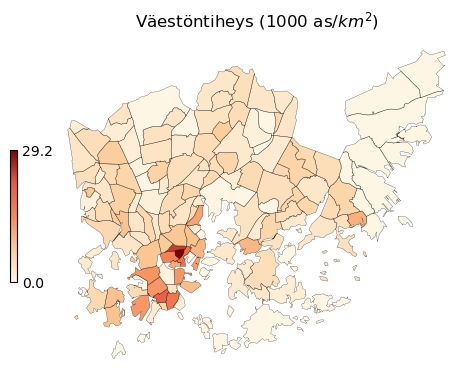

In [21]:
vmin = vakitiheys_df["väestöntiheys"].min()
vmax = vakitiheys_df["väestöntiheys"].max()

cmap = oma_cmap("#fff7e5", "#fbcc98", "#f88656", "#e75843", "#7a0300")

luo_kartta(vakitiheys_df, "väestöntiheys", cmap, "Väestöntiheys (1000 as/$km^2$)", scale=0.4, vmin=vmin,vmax=vmax, colorbar=True, pil=False, borders=0.17, cbar_percent=False, title_fontsize=30, base_fontsize=25)

#### Peruspiirit

In [ ]:
vakitiheys_df = vakiluku_df.overlay(map, how="intersection") # ***
vakitiheys_df = vakitiheys_df.dissolve(by="nimi_fi_1", aggfunc="first").reset_index(drop=False)
vakitiheys_df = vakitiheys_df.dissolve(by="nimi_fi_2", aggfunc="sum").reset_index(drop=False)

vakitiheys_df["pinta_ala"] = vakitiheys_df.geometry.area

vakitiheys_df = vakitiheys_df[["nimi_fi_2", "geometry", "factvalue", "pinta_ala"]].rename(columns={"nimi_fi_2":"nimi_fi", "factvalue":"väkiluku"})

vakitiheys_df["pinta_ala"] = vakitiheys_df["pinta_ala"] / 1000000
vakitiheys_df["väestötiheys"] = vakitiheys_df["väkiluku"] / vakitiheys_df["pinta_ala"]
vakitiheys_df["väestötiheys"] = vakitiheys_df["väestötiheys"].fillna(0)
vakitiheys_df["väestötiheys"] = vakitiheys_df["väestötiheys"] /1000
vakitiheys_df["väestötiheys"] = vakitiheys_df["väestötiheys"].round(1)

vakitiheys_df

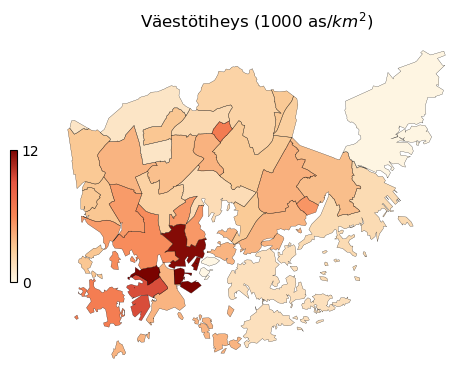

In [277]:
vmin = vakitiheys_df["väestötiheys"].min()
vmax = vakitiheys_df["väestötiheys"].max()

cmap = oma_cmap("#fff7e5", "#fbcc98", "#f88656", "#e75843", "#7a0300")

luo_kartta(vakitiheys_df, "väestötiheys", cmap, "Väestötiheys (1000 as/$km^2$)", scale=0.4, vmin=vmin,vmax=vmax, colorbar=True, pil=False, borders=0.17, cbar_percent=False, title_fontsize=30, base_fontsize=25, save=False)

### Etäisyys keskustasta

In [525]:
peruspiirit_map = map_df.overlay(peruspiirit)
peruspiirit_map = peruspiirit_map.dissolve("nimi_fi").reset_index()

c:\Users\pyryp\anaconda3\envs\geoenv\Lib\site-packages\geopandas\geodataframe.py:2323: UserWarning: `keep_geom_type=True` in overlay resulted in 15 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  return geopandas.overlay(


In [526]:
crs="EPSG:3879"

N=6672630
E=25496860

In [527]:
centerpoint = shapely.Point(25496860, 6672630)
centerpoint
print(centerpoint)

POINT (25496860 6672630)


In [528]:
peruspiirit_map["center"] = peruspiirit_map["geometry"].centroid
centerpoints_df = peruspiirit_map[["nimi_fi","center"]].copy()
centerpoints_df = centerpoints_df.set_geometry("center")

def calculate_distance(geom):
    return geom.distance(centerpoint)

centerpoints_df["distance_to_center"] = centerpoints_df["center"].apply(calculate_distance)

centerpoints_df

,nimi_fi,center,distance_to_center
0,ALPPIHARJU,POINT (25496890.525 6675201.131),2571.312445
1,HAAGA,POINT (25494060.128 6678790.508),6766.914935
2,HERTTONIEMI,POINT (25502357.441 6676298.127),6608.859172
3,ITÄ-PAKILA,POINT (25497919.651 6681978.535),9408.398326
4,JAKOMÄKI,POINT (25504335.570 6682942.897),12737.346806
5,KAARELA,POINT (25493373.287 6681777.128),9789.132938
6,KALLIO,POINT (25497941.193 6674573.958),2224.398829
7,KAMPINMALMI,POINT (25495487.150 6672475.781),1381.485182
8,KULOSAARI,POINT (25500172.963 6674769.616),3943.815378
9,LAAJASALO,POINT (25503297.607 6671711.353),6502.821870


In [529]:
centerpoints_df_map = peruspiirit_map.merge(centerpoints_df)

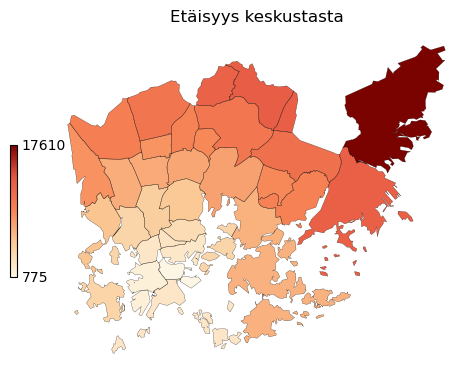

In [530]:
vmin = centerpoints_df["distance_to_center"].min()
vmax = centerpoints_df["distance_to_center"].max()

cmap = oma_cmap("#fff7e5", "#fbcc98", "#f88656", "#e75843", "#7a0300")

luo_kartta(centerpoints_df_map, "distance_to_center", cmap, "Etäisyys keskustasta", scale=0.4, vmin=vmin,vmax=vmax, colorbar=True, pil=False, borders=0.17, cbar_percent=False, title_fontsize=30, base_fontsize=25)

In [531]:
for col in mapillary_signs_wide_norm_signs.columns[1:]:
    # corr = mapillary_signs_wide_norm_signs.sort_values(by="nimi_fi")[col].corr(centerpoints_df.sort_values(by="nimi_fi")["distance_to_center"])
    corr = pearsonr(mapillary_signs_wide_norm_signs.sort_values(by="nimi_fi")[col], centerpoints_df.sort_values(by="nimi_fi")["distance_to_center"])
    try:
        print(f"{fin_classmap[col]}: {corr[0].round(2)}:{corr[1].round(4)}")
    except:
        None

Ajoneuvolla ajaminen kielletty: -0.25:0.162
Etuajo-oikeutettu tie: 0.3:0.0844
Vasemmalle kääntyminen kielletty: -0.63:0.0001
Oikealle kääntyminen kielletty: -0.32:0.0662
Kielletty ajosuunta: -0.53:0.0014
Väistämisvelvollisuus risteyksessä: 0.7:0.0
Yhdistetty pyörätie ja jalkakäytävä: 0.82:0.0
Pyörätie ja jalkakäytävä rinnakkain: -0.18:0.321
Liikenneympyrä: 0.49:0.0034
Moottorikäyttöisellä ajoneuvolla ajo kielletty: -0.01:0.9431
Liikenteenjakaja (oikealle): 0.71:0.0
Pysäköintipaikka: -0.38:0.0261
Pysäköinti kielletty: -0.82:0.0
Pysäyttäminen kielletty: -0.76:0.0
Suojatie: 0.33:0.0554
Työmaa: -0.67:0.0
Varo lapsia: 0.14:0.4222


### Rakennustiheys

In [220]:
rakennus_lkm_df = gpd.read_file("A01S_HKI_Rakennuskanta_20230921_214355.gml")
rakennus_lkm_df

,gml_id,id,alueid,rakennuksen_kaayttotarkoitusid,tiedotid,valmistumisvuosiid,vuosiid,factvalue,nimi_fi,nimi_se,value,geometry
0,A01S_HKI_Rakennuskanta.911101010,1417,911101010,SSS,1,S,2022,245.0,Kruununhaka,Kronohagen,"[Rakennuksia (lkm), Rakennuksia (lkm), Rakennu...","POLYGON ((25497245.691 6673725.015, 25497247.6..."
1,A01S_HKI_Rakennuskanta.911101020,1885,911101020,SSS,1,S,2022,164.0,Kluuvi,Gloet,"[Rakennuksia (lkm), Rakennuksia (lkm), Rakennu...","POLYGON ((25496230.663 6674007.871, 25496260.2..."
2,A01S_HKI_Rakennuskanta.911101080,2353,911101080,SSS,1,S,2022,137.0,Katajanokka,Skatudden,"[Rakennuksia (lkm), Rakennuksia (lkm), Rakennu...","POLYGON ((25497653.036 6672806.979, 25497646.7..."
3,A01S_HKI_Rakennuskanta.911102030,3289,911102030,SSS,1,S,2022,121.0,Kaartinkaupunki,Gardesstaden,"[Rakennuksia (lkm), Rakennuksia (lkm), Rakennu...","POLYGON ((25496735.972 6672760.566, 25496754.8..."
4,A01S_HKI_Rakennuskanta.911102050,3757,911102050,SSS,1,S,2022,250.0,Punavuori,Rödbergen,"[Rakennuksia (lkm), Rakennuksia (lkm), Rakennu...","POLYGON ((25495960.748 6671953.785, 25495956.6..."
...,...,...,...,...,...,...,...,...,...,...,...,...
142,A01S_HKI_Rakennuskanta.917704547,83785,917704547,SSS,1,S,2022,477.0,Rastila,Rastböle,"[Rakennuksia (lkm), Rakennuksia (lkm), Rakennu...","POLYGON ((25506203.670 6677109.746, 25506253.6..."
143,A01S_HKI_Rakennuskanta.917704549,84721,917704549,SSS,1,S,2022,NaN,Mustavuori,Svarta backen,"[Rakennuksia (lkm), Rakennuksia (lkm), Rakennu...","POLYGON ((25507504.947 6680513.061, 25507484.5..."
144,A01S_HKI_Rakennuskanta.918801560,86593,918801560,SSS,1,S,2022,22.0,Salmenkallio,Sundberg,"[Rakennuksia (lkm), Rakennuksia (lkm), Rakennu...","POLYGON ((25507738.603 6680990.840, 25507699.0..."
145,A01S_HKI_Rakennuskanta.918801580,87529,918801580,SSS,1,S,2022,213.0,Karhusaari,Björnsö,"[Rakennuksia (lkm), Rakennuksia (lkm), Rakennu...","POLYGON ((25511089.527 6682026.115, 25511060.0..."


c:\Users\pyryp\anaconda3\envs\geoenv\Lib\site-packages\geopandas\geodataframe.py:2323: UserWarning: `keep_geom_type=True` in overlay resulted in 251 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  return geopandas.overlay(
c:\Users\pyryp\anaconda3\envs\geoenv\Lib\site-packages\geopandas\geodataframe.py:1676: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  aggregated_data = data.groupby(**groupby_kwargs).agg(aggfunc)


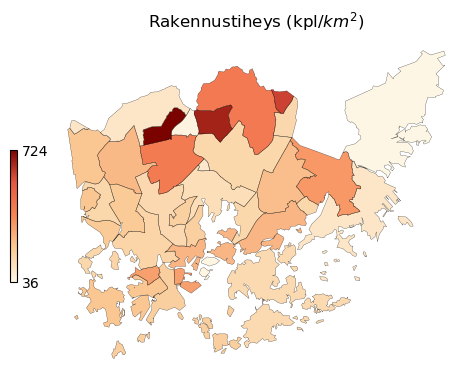

In [225]:
rakennustiheys_df = rakennus_lkm_df.overlay(map, how="intersection") # ***
rakennustiheys_df = rakennustiheys_df.dissolve(by="nimi_fi_1", aggfunc="first").reset_index(drop=False)
rakennustiheys_df = rakennustiheys_df.dissolve(by="nimi_fi_2", aggfunc="sum").reset_index(drop=False)

rakennustiheys_df["pinta_ala"] = rakennustiheys_df.geometry.area

rakennustiheys_df = rakennustiheys_df[["nimi_fi_2", "geometry", "factvalue", "pinta_ala"]].rename(columns={"nimi_fi_2":"nimi_fi", "factvalue":"rakennus_lkm"})

rakennustiheys_df["pinta_ala"] = rakennustiheys_df["pinta_ala"] / 1000000
rakennustiheys_df["rakennustiheys"] = rakennustiheys_df["rakennus_lkm"] / rakennustiheys_df["pinta_ala"]
rakennustiheys_df["rakennustiheys"] = rakennustiheys_df["rakennustiheys"].fillna(0)
rakennustiheys_df["rakennustiheys"] = rakennustiheys_df["rakennustiheys"]
rakennustiheys_df["rakennustiheys"] = rakennustiheys_df["rakennustiheys"].round(0)

rakennustiheys_df
vmin = rakennustiheys_df["rakennustiheys"].min()
vmax = rakennustiheys_df["rakennustiheys"].max()

cmap = oma_cmap("#fff7e5", "#fbcc98", "#f88656", "#e75843", "#7a0300")

luo_kartta(rakennustiheys_df, "rakennustiheys", cmap, "Rakennustiheys (kpl/$km^2$)", scale=0.4, vmin=vmin,vmax=vmax, colorbar=True, pil=False, borders=0.17, cbar_percent=False, title_fontsize=30, base_fontsize=25)

### Kerrosala

In [227]:
kerrosala_df = gpd.read_file("A01S_HKI_Rakennuskanta_20230921_214410.gml")
kerrosala_df

,gml_id,id,alueid,rakennuksen_kaayttotarkoitusid,tiedotid,valmistumisvuosiid,vuosiid,factvalue,nimi_fi,nimi_se,value,geometry
0,A01S_HKI_Rakennuskanta.911101010,1430,911101010,SSS,2,S,2022,872862.0,Kruununhaka,Kronohagen,"[Kerrosala (m2), Kerrosala (m2), Kerrosala (m2...","POLYGON ((25497245.691 6673725.015, 25497247.6..."
1,A01S_HKI_Rakennuskanta.911101020,1898,911101020,SSS,2,S,2022,1367000.0,Kluuvi,Gloet,"[Kerrosala (m2), Kerrosala (m2), Kerrosala (m2...","POLYGON ((25496230.663 6674007.871, 25496260.2..."
2,A01S_HKI_Rakennuskanta.911101080,2366,911101080,SSS,2,S,2022,527199.0,Katajanokka,Skatudden,"[Kerrosala (m2), Kerrosala (m2), Kerrosala (m2...","POLYGON ((25497653.036 6672806.979, 25497646.7..."
3,A01S_HKI_Rakennuskanta.911102030,3302,911102030,SSS,2,S,2022,593011.0,Kaartinkaupunki,Gardesstaden,"[Kerrosala (m2), Kerrosala (m2), Kerrosala (m2...","POLYGON ((25496735.972 6672760.566, 25496754.8..."
4,A01S_HKI_Rakennuskanta.911102050,3770,911102050,SSS,2,S,2022,814452.0,Punavuori,Rödbergen,"[Kerrosala (m2), Kerrosala (m2), Kerrosala (m2...","POLYGON ((25495960.748 6671953.785, 25495956.6..."
...,...,...,...,...,...,...,...,...,...,...,...,...
142,A01S_HKI_Rakennuskanta.917704547,83798,917704547,SSS,2,S,2022,255744.0,Rastila,Rastböle,"[Kerrosala (m2), Kerrosala (m2), Kerrosala (m2...","POLYGON ((25506203.670 6677109.746, 25506253.6..."
143,A01S_HKI_Rakennuskanta.918801550,86138,918801550,SSS,2,S,2022,51105.0,Östersundom,Östersundom,"[Kerrosala (m2), Kerrosala (m2), Kerrosala (m2...","POLYGON ((25507973.123 6683082.566, 25507976.2..."
144,A01S_HKI_Rakennuskanta.918801570,87074,918801570,SSS,2,S,2022,7256.0,Talosaari,Husö,"[Kerrosala (m2), Kerrosala (m2), Kerrosala (m2...","POLYGON ((25509986.449 6681250.601, 25509980.7..."
145,A01S_HKI_Rakennuskanta.918801591,88010,918801591,SSS,2,S,2022,53697.0,Landbo,Landbo,"[Kerrosala (m2), Kerrosala (m2), Kerrosala (m2...","POLYGON ((25507845.977 6683589.183, 25507846.7..."


c:\Users\pyryp\anaconda3\envs\geoenv\Lib\site-packages\geopandas\geodataframe.py:2323: UserWarning: `keep_geom_type=True` in overlay resulted in 251 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  return geopandas.overlay(
c:\Users\pyryp\anaconda3\envs\geoenv\Lib\site-packages\geopandas\geodataframe.py:1676: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  aggregated_data = data.groupby(**groupby_kwargs).agg(aggfunc)


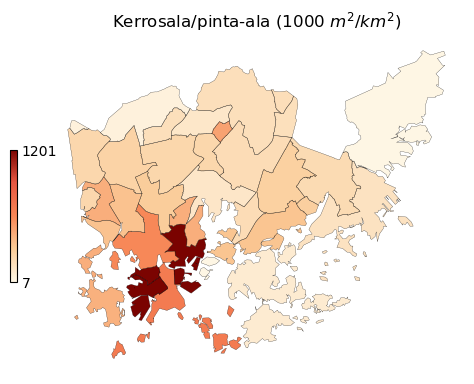

In [230]:
kerrosalatiheys_df = kerrosala_df.overlay(map, how="intersection") # ***
kerrosalatiheys_df = kerrosalatiheys_df.dissolve(by="nimi_fi_1", aggfunc="first").reset_index(drop=False)
kerrosalatiheys_df = kerrosalatiheys_df.dissolve(by="nimi_fi_2", aggfunc="sum").reset_index(drop=False)

kerrosalatiheys_df["pinta_ala"] = kerrosalatiheys_df.geometry.area

kerrosalatiheys_df = kerrosalatiheys_df[["nimi_fi_2", "geometry", "factvalue", "pinta_ala"]].rename(columns={"nimi_fi_2":"nimi_fi", "factvalue":"rakennus_lkm"})

kerrosalatiheys_df["pinta_ala"] = kerrosalatiheys_df["pinta_ala"] / 1000000
kerrosalatiheys_df["rakennustiheys"] = kerrosalatiheys_df["rakennus_lkm"] / kerrosalatiheys_df["pinta_ala"]
kerrosalatiheys_df["rakennustiheys"] = kerrosalatiheys_df["rakennustiheys"].fillna(0)
kerrosalatiheys_df["rakennustiheys"] = kerrosalatiheys_df["rakennustiheys"] /1000
kerrosalatiheys_df["rakennustiheys"] = kerrosalatiheys_df["rakennustiheys"].round(1)

kerrosalatiheys_df
vmin = kerrosalatiheys_df["rakennustiheys"].min()
vmax = kerrosalatiheys_df["rakennustiheys"].max()

cmap = oma_cmap("#fff7e5", "#fbcc98", "#f88656", "#e75843", "#7a0300")

luo_kartta(kerrosalatiheys_df, "rakennustiheys", cmap, "Kerrosala/pinta-ala (1000 $m^2$/$km^2$)", scale=0.4, vmin=vmin,vmax=vmax, colorbar=True, pil=False, borders=0.17, cbar_percent=False, title_fontsize=30, base_fontsize=25)

### Rakennusten ikä

In [258]:
rakennus_ikä_df = pd.read_excel("rakennusten ikä.xlsx")
rakennus_ikä_df

,Peruspiiri,100,90,80,60,50,40,30,20,10,0
0,VIRONNIEMI,289,88,30,25,15,36,18,21,21,3
1,ULLANLINNA,494,188,72,96,36,30,25,39,29,11
2,KAMPINMALMI,232,329,77,34,29,39,83,45,127,46
3,TAKA-TÖÖLÖ,34,259,62,9,13,13,9,8,9,0
4,LAUTTASAARI,6,27,235,234,103,62,29,50,77,12
5,REIJOLA,32,45,205,49,11,33,240,53,29,9
6,MUNKKINIEMI,14,80,252,177,58,52,94,51,30,27
7,HAAGA,10,18,261,225,137,153,37,37,61,23
8,PITÄJÄNMÄKI,20,46,311,233,171,194,167,197,144,36
9,KAARELA,4,1,470,176,225,668,287,311,251,167


In [259]:
def weighted_average(row):
    weights = row.index[1:]
    values = [row[col] for col in weights]
    weighted_sum = sum(w * v for w, v in zip(weights, values))
    total_weight = sum(values)
    return weighted_sum / total_weight

In [260]:
rakennus_ikä_df["keski-ikä"] = rakennus_ikä_df.apply(weighted_average, axis=1).round(1)
rakennus_ikä_df

,Peruspiiri,100,90,80,60,50,40,30,20,10,0,keski-ikä
0,VIRONNIEMI,289,88,30,25,15,36,18,21,21,3,80.7
1,ULLANLINNA,494,188,72,96,36,30,25,39,29,11,81.0
2,KAMPINMALMI,232,329,77,34,29,39,83,45,127,46,66.0
3,TAKA-TÖÖLÖ,34,259,62,9,13,13,9,8,9,0,81.5
4,LAUTTASAARI,6,27,235,234,103,62,29,50,77,12,55.3
5,REIJOLA,32,45,205,49,11,33,240,53,29,9,52.4
6,MUNKKINIEMI,14,80,252,177,58,52,94,51,30,27,58.1
7,HAAGA,10,18,261,225,137,153,37,37,61,23,54.5
8,PITÄJÄNMÄKI,20,46,311,233,171,194,167,197,144,36,47.2
9,KAARELA,4,1,470,176,225,668,287,311,251,167,40.6


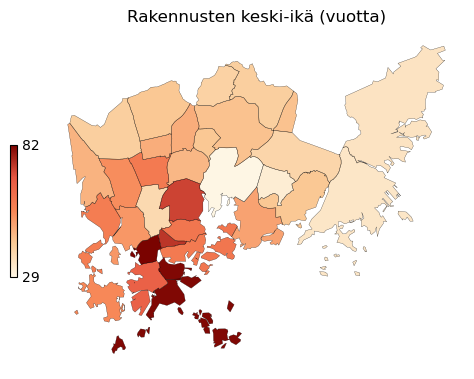

In [274]:
rakennusikä_map = peruspiirit_map.merge(rakennus_ikä_df, left_on="nimi_fi", right_on="Peruspiiri")

rakennusikä_map["keski-ikä"] = rakennusikä_map["keski-ikä"].round(0)

vmin = rakennusikä_map["keski-ikä"].min()
vmax = rakennusikä_map["keski-ikä"].max()

cmap = oma_cmap("#fff7e5", "#fbcc98", "#f88656", "#e75843", "#7a0300")

luo_kartta(rakennusikä_map, "keski-ikä", cmap, "Rakennusten keski-ikä (vuotta)", scale=0.4, vmin=vmin,vmax=vmax, colorbar=True, pil=False, borders=0.17, cbar_percent=False, title_fontsize=30, base_fontsize=25, save=False)